In [2]:
import os
import pandas as pd
import scanpy as sc
import anndata as ad

# 데이터 디렉토리
data_dir = "/home/Data_Drive_8TB/kykim/GC/"

# 파일 리스트
file_list = [
    "GSM5573466_sample1.csv.gz", "GSM5573467_sample2.csv.gz",
    "GSM5573468_sample3.csv.gz", "GSM5573469_sample4.csv.gz",
    "GSM5573470_sample5.csv.gz", "GSM5573471_sample6.csv.gz",
    "GSM5573472_sample7.csv.gz", "GSM5573473_sample8.csv.gz",
    "GSM5573474_sample9.csv.gz", "GSM5573475_sample10.csv.gz",
    "GSM5573476_sample11.csv.gz", "GSM5573477_sample12.csv.gz",
    "GSM5573478_sample13.csv.gz", "GSM5573479_sample14.csv.gz",
    "GSM5573480_sample15.csv.gz", "GSM5573481_sample16.csv.gz",
    "GSM5573482_sample17.csv.gz", "GSM5573483_sample18.csv.gz",
    "GSM5573484_sample19.csv.gz", "GSM5573485_sample20.csv.gz",
    "GSM5573486_sample21.csv.gz", "GSM5573487_sample22.csv.gz",
    "GSM5573488_sample23.csv.gz", "GSM5573489_sample24.csv.gz",
    "GSM5573490_sample25.csv.gz", "GSM5573491_sample26.csv.gz",
    "GSM5573492_sample27.csv.gz", "GSM5573493_sample28.csv.gz",
    "GSM5573494_sample29.csv.gz", "GSM5573495_sample30.csv.gz",
    "GSM5573496_sample31.csv.gz", "GSM5573497_sample32.csv.gz",
    "GSM5573498_sample33.csv.gz", "GSM5573499_sample34.csv.gz",
    "GSM5573500_sample35.csv.gz", "GSM5573501_sample36.csv.gz",
    "GSM5573502_sample37.csv.gz", "GSM5573503_sample38.csv.gz",
    "GSM5573504_sample39.csv.gz", "GSM5573505_sample40.csv.gz"
]

# Normal 샘플 목록
normal_samples = {
    "GSM5573466_sample1", "GSM5573469_sample4", "GSM5573471_sample6",
    "GSM5573474_sample9", "GSM5573476_sample11", "GSM5573486_sample21",
    "GSM5573488_sample23", "GSM5573490_sample25", "GSM5573496_sample31",
    "GSM5573500_sample35"
}

first_adata = None
reference_genes = None
all_adata = []

for file_name in file_list:
    file_path = os.path.join(data_dir, file_name)
    
    # 파일 읽기
    df = pd.read_csv(file_path, compression='gzip', index_col=0)
    adata = ad.AnnData(df.T)  # 전치해서 (cells x genes)
    
    sample_id = file_name.replace(".csv.gz", "")
    
    # sample과 status 정보 추가
    adata.obs['sample'] = sample_id
    adata.obs['status'] = "Normal" if sample_id in normal_samples else "Tumor"
    
    if first_adata is None:
        first_adata = adata
        reference_genes = adata.var_names
    else:
        if not adata.var_names.equals(reference_genes):
            print(f"❌ 병합 중단: {file_name}의 유전자 목록이 일치하지 않습니다.")
            break
    
    all_adata.append(adata)

# 병합
if len(all_adata) > 1:
    merged_adata = ad.concat(all_adata, join="outer", merge="same")
    print("✅ 모든 샘플이 정상적으로 병합되었습니다.")
else:
    merged_adata = first_adata
    print("⚠ 단일 샘플만 처리됨.")

# 결과 출력
print(merged_adata)
print(merged_adata.obs[['sample', 'status']].value_counts())


✅ 모든 샘플이 정상적으로 병합되었습니다.
AnnData object with n_obs × n_vars = 158641 × 26571
    obs: 'sample', 'status'
sample               status
GSM5573480_sample15  Tumor     13626
GSM5573499_sample34  Tumor     12463
GSM5573500_sample35  Normal     8388
GSM5573482_sample17  Tumor      7380
GSM5573479_sample14  Tumor      7276
GSM5573473_sample8   Tumor      7177
GSM5573483_sample18  Tumor      6859
GSM5573493_sample28  Tumor      6173
GSM5573498_sample33  Tumor      5823
GSM5573504_sample39  Tumor      5369
GSM5573505_sample40  Tumor      5077
GSM5573492_sample27  Tumor      4600
GSM5573485_sample20  Tumor      4487
GSM5573490_sample25  Normal     4140
GSM5573488_sample23  Normal     3809
GSM5573495_sample30  Tumor      3798
GSM5573470_sample5   Tumor      3693
GSM5573494_sample29  Tumor      3593
GSM5573468_sample3   Tumor      3525
GSM5573501_sample36  Tumor      3363
GSM5573474_sample9   Normal     3319
GSM5573467_sample2   Tumor      2769
GSM5573466_sample1   Normal     2685
GSM5573491_sample

In [3]:
# 저장할 경로 설정
save_path = "/home/Data_Drive_8TB/kykim/GC/merged_data.h5ad"

# AnnData 객체 저장
merged_adata.write(save_path)

print(f"✅ 병합된 데이터가 {save_path}에 저장되었습니다.")


✅ 병합된 데이터가 /home/Data_Drive_8TB/kykim/GC/merged_data.h5ad에 저장되었습니다.


In [4]:
import scanpy as sc

# 경로 설정
adata_path = '/home/Data_Drive_8TB/kykim/GC/merged_data.h5ad' 

# 파일 불러오기
adata = sc.read_h5ad(adata_path)


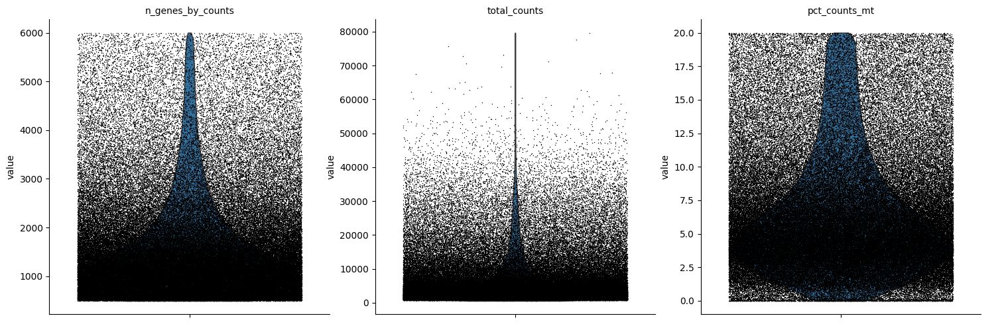

(158641, 26571)


In [5]:
import scanpy as sc
adata.var["mt"] = adata.var_names.str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=False
)
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)


print(adata.X.shape)

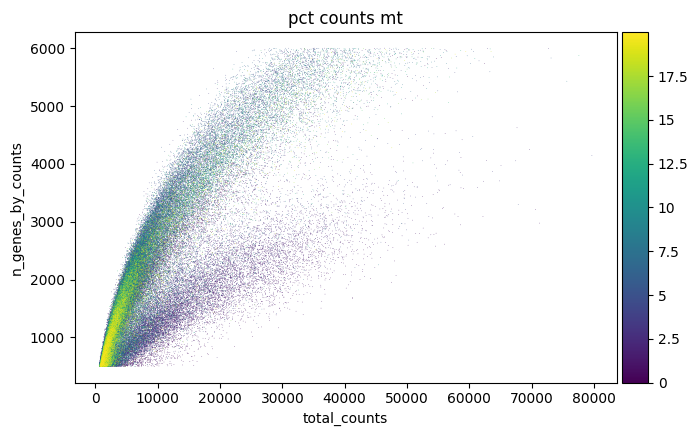

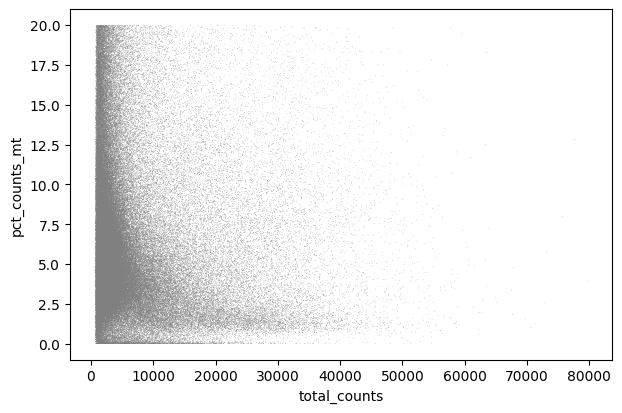

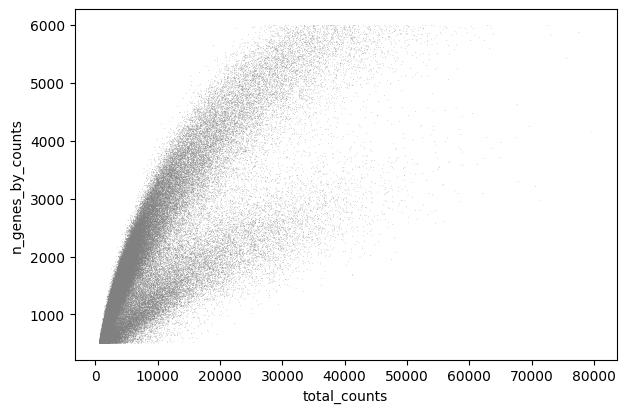

(158622, 25750)


In [6]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")
adata = adata[(adata.obs.n_genes_by_counts >= 500) & (adata.obs.n_genes_by_counts <= 6000), :]
adata = adata[adata.obs.pct_counts_mt < 20, :].copy()

print(adata.X.shape)

In [7]:
adata.obs

,sample,status,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,n_genes
AAACCTGAGGCTACGA_8,GSM5573466_sample1,Normal,3501,10969,27.331571,37.213967,48.153888,62.549002,1113,10.146777,1376,12.544443,5,0.045583,3501
AAACCTGAGGTTCCTA_8,GSM5573466_sample1,Normal,1116,2312,35.986159,45.631488,56.487889,73.356401,29,1.254325,340,14.705882,1,0.043253,1116
AAACCTGGTTGACGTT_8,GSM5573466_sample1,Normal,1673,4204,33.468126,43.458611,54.947669,71.289248,557,13.249286,626,14.890580,0,0.000000,1673
AAACCTGTCCATGAAC_8,GSM5573466_sample1,Normal,1559,4048,35.622530,46.096838,57.312253,73.838933,554,13.685771,602,14.871542,0,0.000000,1559
AAACGGGAGTGTACGG_8,GSM5573466_sample1,Normal,1027,2337,35.857938,48.352589,60.847240,77.449722,181,7.744972,414,17.715019,1,0.042790,1027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTGAGCTCC.1_40,GSM5573505_sample40,Tumor,1575,5265,38.252612,50.921178,63.779677,78.556505,506,9.610636,1250,23.741690,4,0.075973,1575
TTTGGTTTCACCTCGT.1_40,GSM5573505_sample40,Tumor,2208,5887,29.098013,38.984202,49.957534,65.823000,492,8.357398,858,14.574486,0,0.000000,2208
TTTGGTTTCTTCCCAG.1_40,GSM5573505_sample40,Tumor,1327,10538,81.818182,84.674511,87.834504,92.152211,408,3.871702,479,4.545455,0,0.000000,1327
TTTGTTGCAGACACAG.1_40,GSM5573505_sample40,Tumor,949,2198,35.350318,47.998180,61.692448,79.572338,194,8.826206,329,14.968153,1,0.045496,949


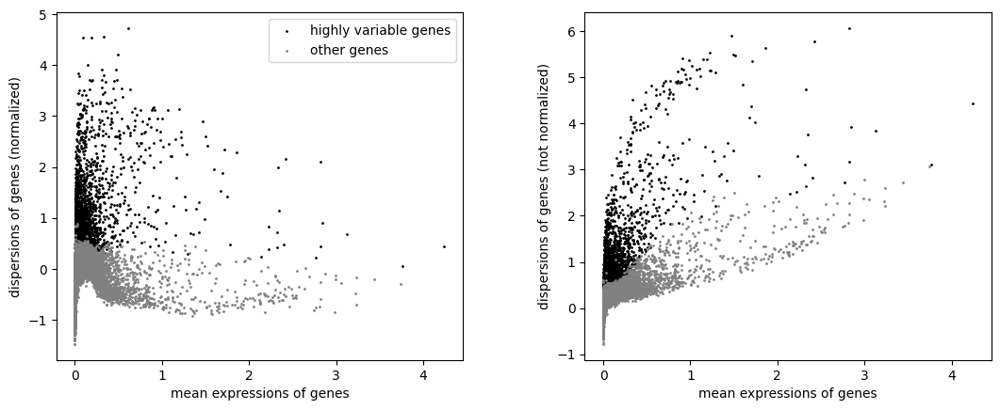

(158373, 25750)


In [8]:
sc.pp.scrublet(adata, batch_key="sample")
adata = adata[~adata.obs['predicted_doublet']].copy()

adata.raw = adata.copy()
adata.layers["counts"] = adata.X.copy()
raw_var_names = adata.var_names.copy()

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
# sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
sc.pp.highly_variable_genes(adata, n_top_genes=3000, batch_key="sample")
sc.pp.scale(adata, max_value=10)
sc.pl.highly_variable_genes(adata)
print(adata.X.shape)

In [9]:
# adata = adata[:, adata.var.highly_variable]

In [10]:
# 저장할 경로 설정
save_path = "/home/Data_Drive_8TB/kykim/GC/checkpoint_data.h5ad"

# AnnData 객체 저장
adata.write(save_path)

print(f"✅ 병합된 데이터가 {save_path}에 저장되었습니다.")


✅ 병합된 데이터가 /home/Data_Drive_8TB/kykim/GC/checkpoint_data.h5ad에 저장되었습니다.


In [11]:
import scanpy as sc

# 경로 설정
adata_path = '/home/Data_Drive_8TB/kykim/GC/checkpoint_data.h5ad' 

# 파일 불러오기
adata = sc.read_h5ad(adata_path)


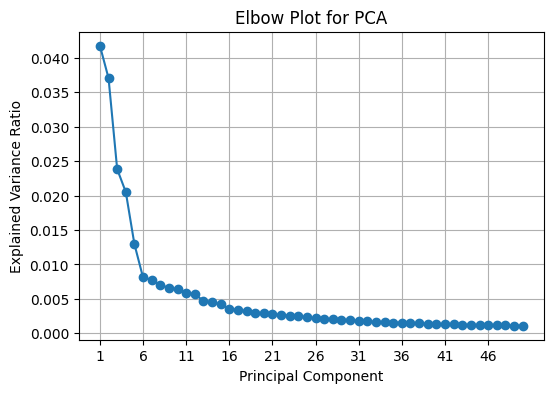

In [12]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

sc.tl.pca(adata)
explained_variance_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

sc.tl.pca(adata, n_comps=31)

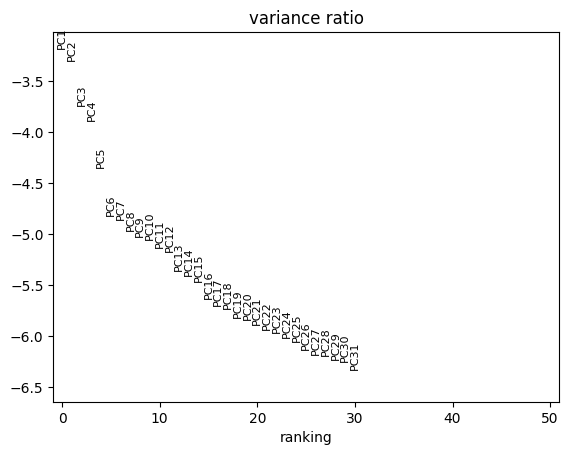

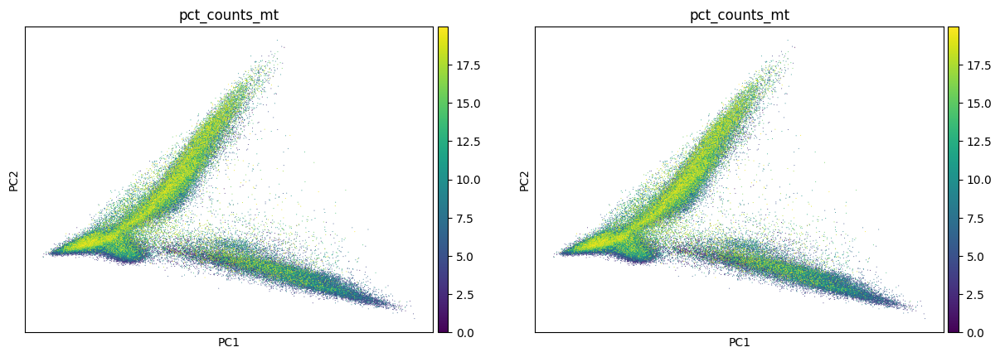

In [13]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)
sc.pl.pca(
    adata,
    color=["pct_counts_mt", "pct_counts_mt"],
    ncols=2,
    size=2,
)

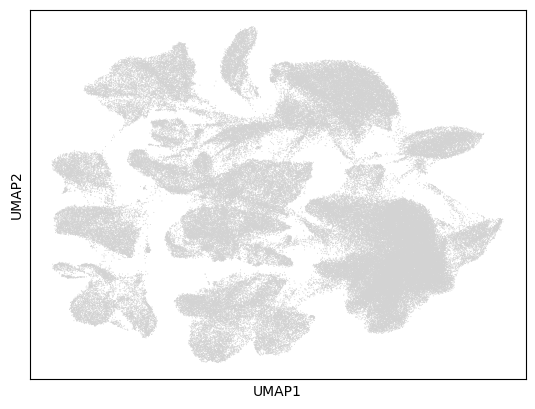

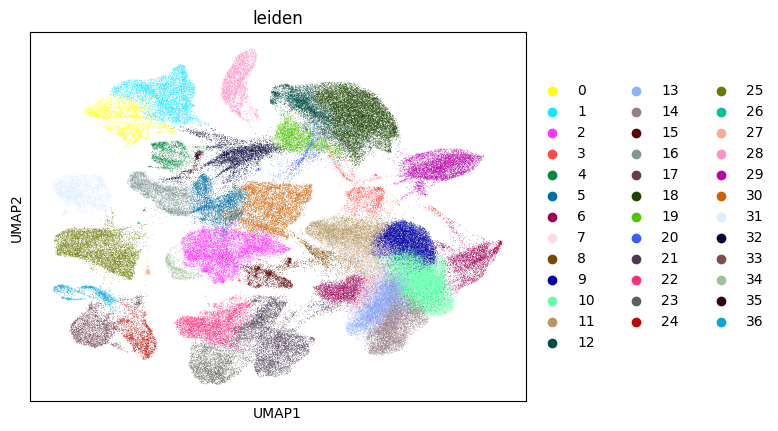

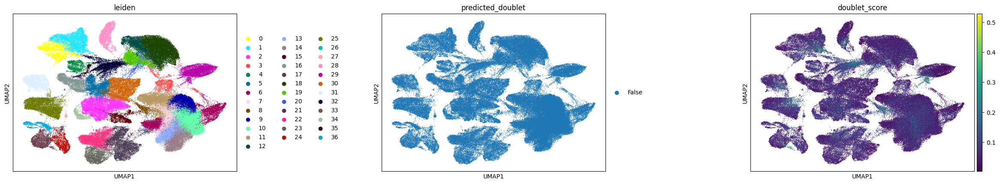

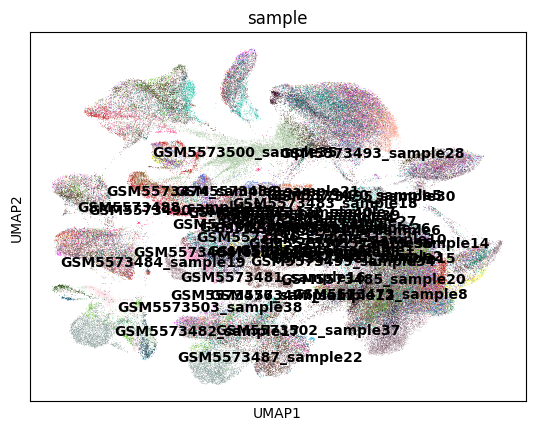

In [14]:
import bbknn 
import scanpy as sc
import scanpy.external as sce

sce.pp.bbknn(adata, batch_key='sample')
sc.pp.neighbors(adata)
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    size=2,
)
sc.pl.umap(adata, color=["leiden"])
sc.pl.umap(
    adata,
    color=["leiden", "predicted_doublet", "doublet_score"],
    # increase horizontal space between panels
    wspace=0.5,
    size=3,
)
sc.pl.umap(
    adata,
    color=['sample'],
    legend_loc="on data",
)

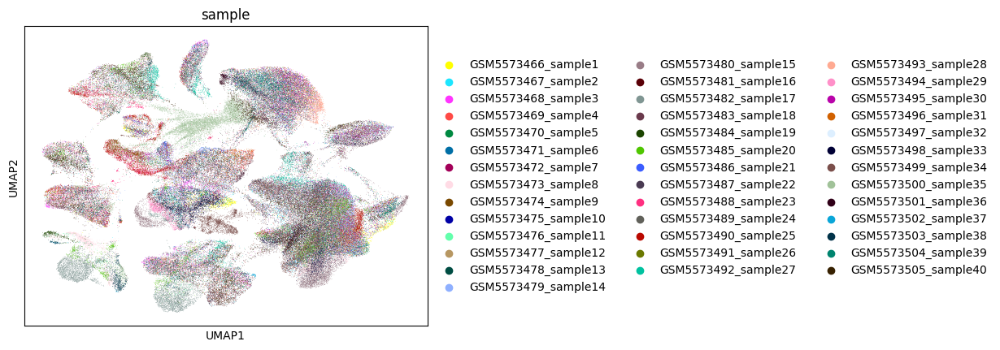

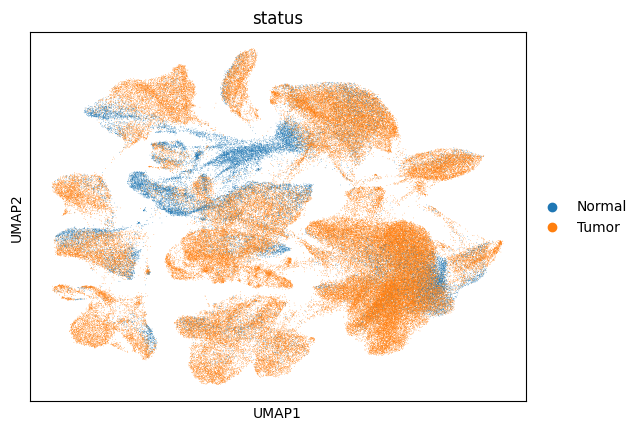

In [15]:
sc.pl.umap(
    adata,
    color=['sample']
)
sc.pl.umap(
    adata,
    color=['status']
)

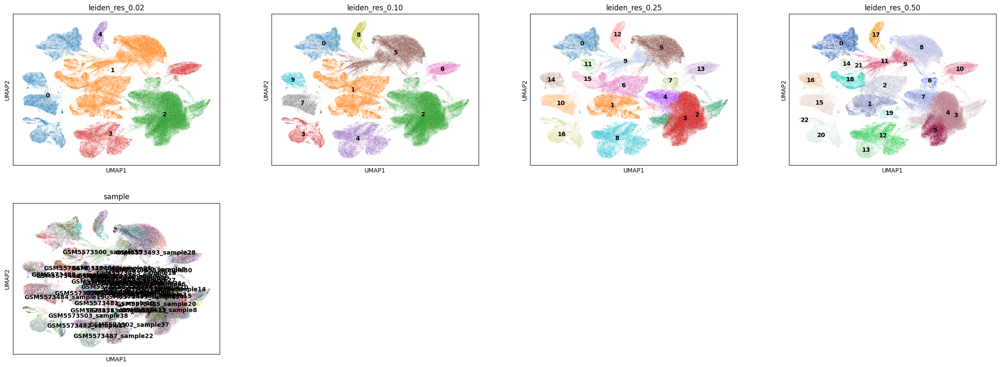

In [16]:
for res in [0.02, 0.1, 0.25, 0.3,0.5]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )
sc.pl.umap(
    adata,
    color=["leiden_res_0.02", "leiden_res_0.10","leiden_res_0.25","leiden_res_0.50",'sample'],
    legend_loc="on data",
)

/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highl

Cluster 0: ['PECAM1', 'HSPG2', 'RAMP2', 'CRIP2', 'A2M', 'GNG11', 'EGFL7', 'ENG', 'VWF', 'SPARCL1', 'CAVIN1', 'ECSCR', 'ESAM', 'CALCRL', 'ADGRL4']
Cluster 1: ['ELF3', 'COX5B', 'PPDPF', 'ELOB', 'SPINT2', 'CLDN7', 'NAPRT', 'PKP3', 'COX4I1', 'MISP', 'RAB25', 'EPS8L3', 'KLF5', 'EPS8L2', 'LSR']
Cluster 2: ['CAPN8', 'MLPH', 'VSIG2', 'MUC5AC', 'ELF3', 'SULT1C2', 'CYP3A5', 'MUC1', 'ABCC3', 'ERN2', 'SMIM22', 'MICALL2', 'SLC44A4', 'RASEF', 'GALE']
Cluster 3: ['NKG7', 'CCL5', 'CST7', 'CD7', 'KLRD1', 'CD247', 'PRF1', 'SYTL3', 'HCST', 'SLA2', 'IL2RB', 'KIR2DL4', 'HOPX', 'MATK', 'ARHGAP9']
Cluster 4: ['CD3E', 'IL7R', 'CD3D', 'CXCR4', 'CD2', 'CD52', 'KLRB1', 'CD3G', 'CD8A', 'PTPRC', 'SPOCK2', 'LCK', 'CD96', 'CD6', 'BTG1']
Cluster 5: ['CCL5', 'CST7', 'CD8A', 'CD3E', 'NKG7', 'GZMK', 'CD3D', 'GZMH', 'PTPRC', 'HCST', 'CD8B', 'PTPRCAP', 'CD3G', 'CD2', 'GZMM']
Cluster 6: ['STMN1', 'HMGB2', 'HMGN2', 'H2AFV', 'RAC2', 'HMGB1', 'CORO1A', 'SMC4', 'MKI67', 'H2AFZ', 'TYMS', 'TUBA1B', 'TUBB', 'CENPM', 'PFN1']
Clust

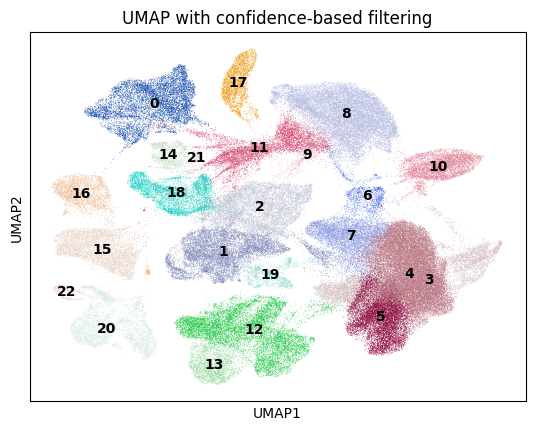

In [17]:
import scanpy as sc
sc.tl.rank_genes_groups(adata, groupby='leiden_res_0.50', method='t-test')  # 또는 'wilcoxon'
# 각 클러스터별 상위 10개 유전자 추출
top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:15]
    top_genes[group] = genes.tolist()

# 결과 확인
for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    adata,
    color='leiden_res_0.50',
    title='UMAP with confidence-based filtering',
    legend_loc='on data'  # 또는 'right margin', 'none'
)


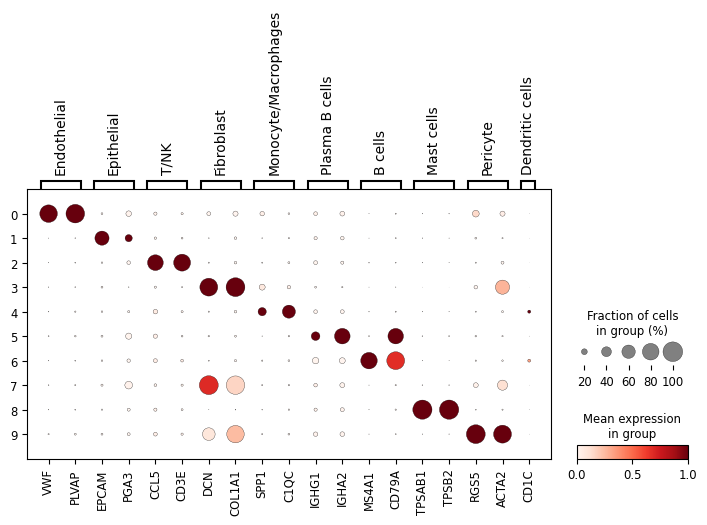

In [18]:
import scanpy as sc

marker_genes = {
    'Endothelial' : ['VWF','PLVAP'],
    "Epithelial": ['EPCAM', 'PGA3'],
    "T/NK": ['CCL5', 'CD3E'],
    'Fibroblast' : ['DCN', 'COL1A1'],
    'Monocyte/Macrophages' : ['SPP1', 'C1QC'],
    "Plasma B cells": ['IGHG1','IGHA2'],
    'B cells' : ['MS4A1','CD79A'],
    'Mast cells' :['TPSAB1','TPSB2'],
    'Pericyte' : ['RGS5','ACTA2'],
    'Dendritic cells' : ['CD1C']}

existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in marker_genes.items()}

# 빈 리스트가 아닌 카테고리만 유지
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(adata, existing_genes, groupby="leiden_res_0.10", standard_scale="var")
    

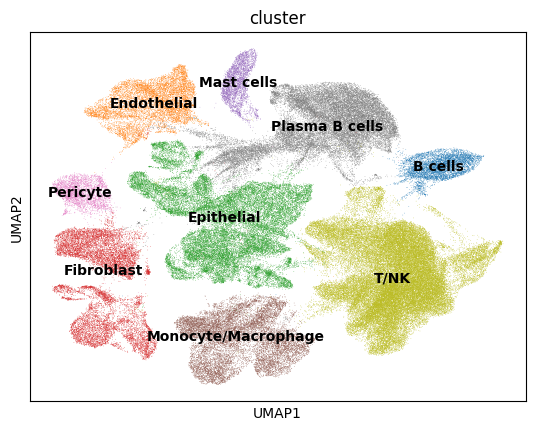

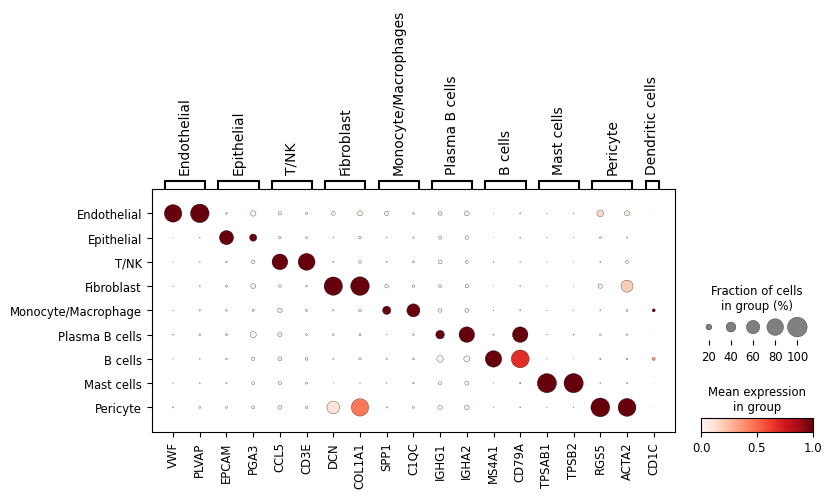

In [19]:
# 매핑 딕셔너리 정의
cluster_labels = {
    0: 'Endothelial',
    1: 'Epithelial',
    2: 'T/NK',
    3: 'Fibroblast',
    4: 'Monocyte/Macrophage',
    5: 'Plasma B cells',
    6: 'B cells',
    7: 'Fibroblast',
    8: 'Mast cells',
    9: 'Pericyte'
}

# 새로운 컬럼에 매핑 적용
adata.obs['cluster'] = adata.obs['leiden_res_0.10'].astype(int).map(cluster_labels)
sc.pl.umap(
    adata,
    color=['cluster'],
    legend_loc="on data")
desired_order = [
    'Endothelial',
    'Epithelial',
    'T/NK',
    'Fibroblast',
    'Monocyte/Macrophage',
    'Plasma B cells',
    'B cells',
    'Mast cells',
    'Pericyte'
]

# 카테고리 순서 설정
adata.obs['cluster'] = pd.Categorical(adata.obs['cluster'], categories=desired_order, ordered=True)

# 정렬된 순서로 dotplot 그리기
sc.pl.dotplot(adata, existing_genes, groupby="cluster", standard_scale="var")

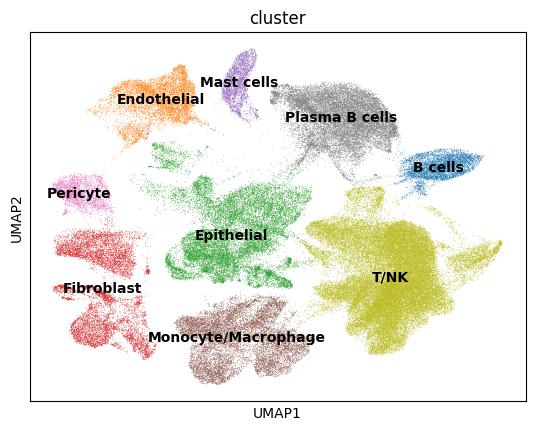

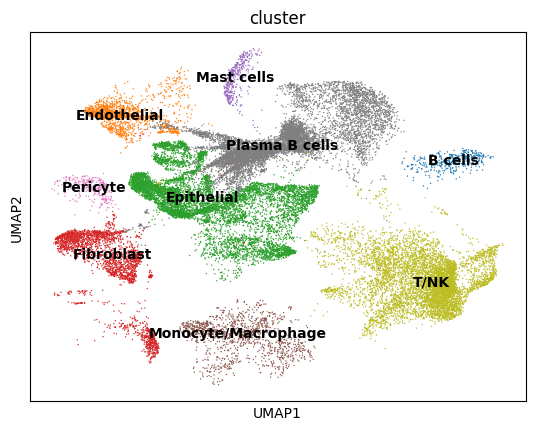

In [20]:
# tumor와 normal로 AnnData 나누기
adata_tumor = adata[adata.obs['status'] == 'Tumor'].copy()
adata_normal = adata[adata.obs['status'] == 'Normal'].copy()

# 클러스터 라벨 적용 (leiden -> cluster 이름)
adata_tumor.obs['cluster'] = adata_tumor.obs['leiden_res_0.10'].astype(int).map(cluster_labels)
adata_normal.obs['cluster'] = adata_normal.obs['leiden_res_0.10'].astype(int).map(cluster_labels)

adata_tumor.obs['cluster'] = adata_tumor.obs['leiden_res_0.10'].astype(int).map(cluster_labels)
sc.pl.umap(
    adata_tumor,
    color=['cluster'],
    legend_loc="on data")

adata_normal.obs['cluster'] = adata_normal.obs['leiden_res_0.10'].astype(int).map(cluster_labels)
sc.pl.umap(
    adata_normal,
    color=['cluster'],
    legend_loc="on data")

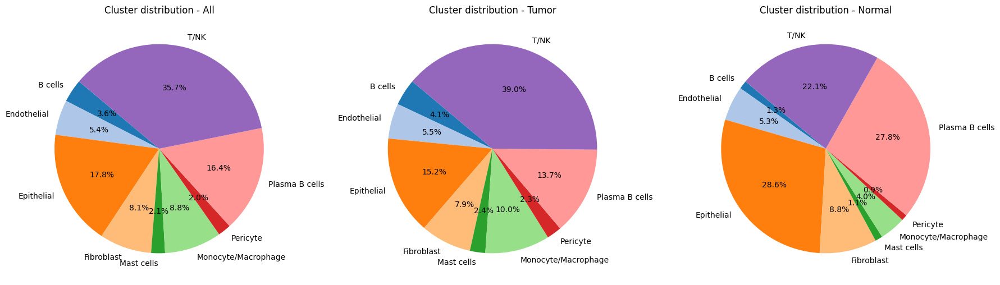

cluster
T/NK                   56552
Epithelial             28269
Plasma B cells         26033
Monocyte/Macrophage    13967
Fibroblast             12750
Endothelial             8596
B cells                 5624
Mast cells              3378
Pericyte                3204
Name: count, dtype: int64
cluster
T/NK                   49675
Epithelial             19382
Plasma B cells         17381
Monocyte/Macrophage    12715
Fibroblast             10001
Endothelial             6937
B cells                 5219
Mast cells              3021
Pericyte                2917
Name: count, dtype: int64
cluster
Epithelial             8887
Plasma B cells         8652
T/NK                   6877
Fibroblast             2749
Endothelial            1659
Monocyte/Macrophage    1252
B cells                 405
Mast cells              357
Pericyte                287
Name: count, dtype: int64


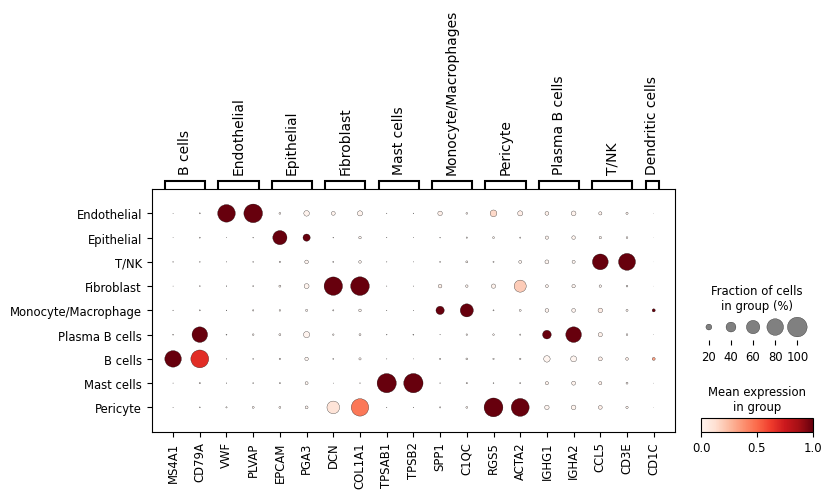

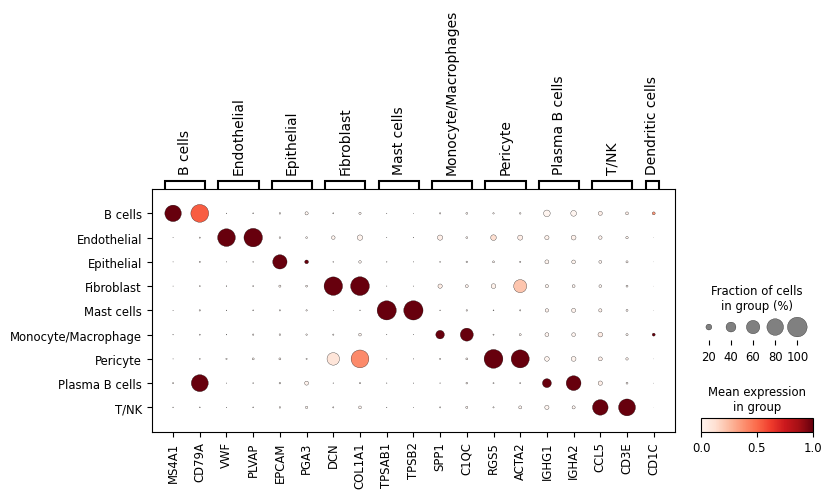

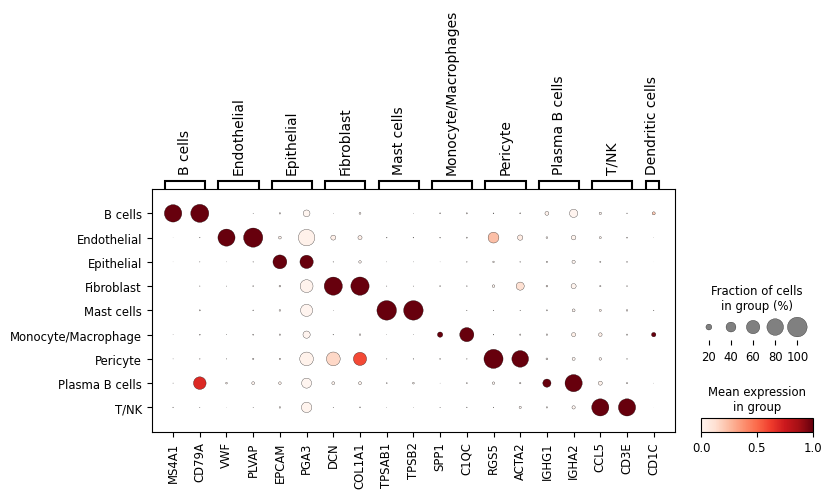

In [21]:
import matplotlib.pyplot as plt

marker_genes = {
    'B cells' : ['MS4A1','CD79A'],
    'Endothelial' : ['VWF','PLVAP'],
    "Epithelial": ['EPCAM', 'PGA3'],
    'Fibroblast' : ['DCN', 'COL1A1'],
    'Mast cells' :['TPSAB1','TPSB2'],    
    'Monocyte/Macrophages' : ['SPP1', 'C1QC'],
    'Pericyte' : ['RGS5','ACTA2'],    
    "Plasma B cells": ['IGHG1','IGHA2'],    
    "T/NK": ['CCL5', 'CD3E'],
    'Dendritic cells' : ['CD1C']}
existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in marker_genes.items()}

# 클러스터 비율 계산
total_counts = adata.obs['cluster'].value_counts().sort_index()
tumor_counts = adata_tumor.obs['cluster'].value_counts().sort_index()
normal_counts = adata_normal.obs['cluster'].value_counts().sort_index()

# 공통 라벨 확보
labels = sorted(set(total_counts.index).union(tumor_counts.index).union(normal_counts.index))

# 비율 계산
total_sizes = [total_counts.get(label, 0) for label in labels]
tumor_sizes = [tumor_counts.get(label, 0) for label in labels]
normal_sizes = [normal_counts.get(label, 0) for label in labels]

# 색상 지정
colors = plt.cm.tab20.colors[:len(labels)]

# 파이 플롯
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 전체 adata plot
axes[0].pie(total_sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
axes[0].set_title('Cluster distribution - All')

# Tumor plot
axes[1].pie(tumor_sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
axes[1].set_title('Cluster distribution - Tumor')

# Normal plot
axes[2].pie(normal_sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
axes[2].set_title('Cluster distribution - Normal')

plt.tight_layout()
plt.show()
print(adata.obs['cluster'].value_counts())
print(adata_tumor.obs['cluster'].value_counts())
print(adata_normal.obs['cluster'].value_counts())
sc.pl.dotplot(adata, existing_genes, groupby="cluster", standard_scale="var")
sc.pl.dotplot(adata_tumor, existing_genes, groupby="cluster", standard_scale="var")
sc.pl.dotplot(adata_normal, existing_genes, groupby="cluster", standard_scale="var")

In [22]:
Xadata = adata.copy()
Xadata.X = Xadata.layers["counts"]
sc.pp.normalize_total(Xadata)
sc.pp.log1p(Xadata)

⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 158373 cells and 25750 genes
🔗 Matching reference genes in the model
🧬 5933 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25
🗳️ Majority voting the predictions
✅ Majority voting done!


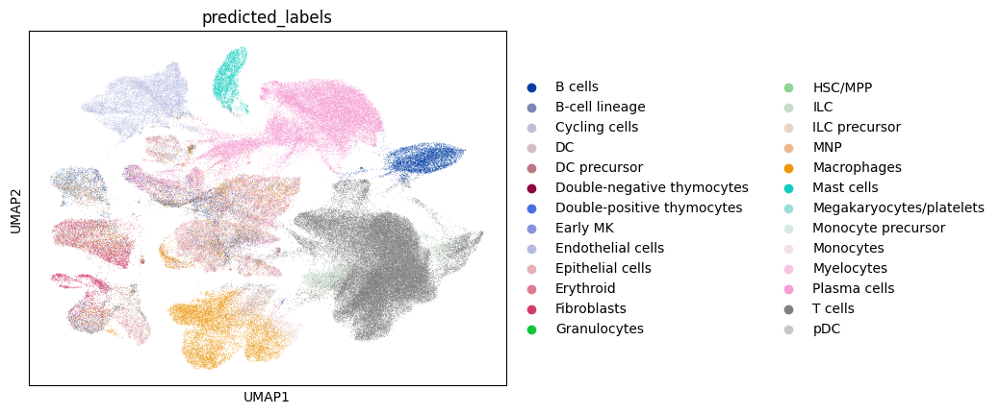

In [52]:
import celltypist

predictions = celltypist.annotate(Xadata, model = 'Immune_All_High.pkl', majority_voting = True)
adata = predictions.to_adata()
sc.pl.umap(Xadata, color = ['predicted_labels'])

In [53]:
Xadata.write("/home/Data_Drive_8TB/kykim/GC/checkpoint_data.h5ad")

In [8]:
import scanpy as sc
Xadata = sc.read_h5ad('/home/Data_Drive_8TB/kykim/GC/checkpoint_data.h5ad')

In [9]:
Xadata.obs['predicted_labels'].value_counts()

predicted_labels
T cells                       59018
Plasma cells                  32880
Macrophages                   17545
Epithelial cells              10930
B cells                        9102
Endothelial cells              8898
ILC                            6521
Fibroblasts                    6049
Mast cells                     3349
DC                             1720
Monocytes                      1255
Double-positive thymocytes      573
Erythroid                       244
Myelocytes                      106
pDC                             103
Cycling cells                    24
Early MK                         18
Double-negative thymocytes       14
HSC/MPP                           9
B-cell lineage                    5
Megakaryocytes/platelets          3
Granulocytes                      3
DC precursor                      1
ILC precursor                     1
MNP                               1
Monocyte precursor                1
Name: count, dtype: int64

In [10]:
Xadata = Xadata[Xadata.obs['cluster'] == 'Monocyte/Macrophage']
Xadata.obs

,sample,status,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,pct_counts_mt,...,leiden_res_0.02,leiden_res_0.10,leiden_res_0.25,leiden_res_0.30,leiden_res_0.50,cluster,predicted_labels,over_clustering,majority_voting,conf_score
AAAGATGTCAATACCG_8,GSM5573466_sample1,Normal,3016,11630,32.957868,43.465176,55.279450,70.232158,1150,9.888220,...,3,4,8,8,12,Monocyte/Macrophage,Macrophages,9,Macrophages,0.902852
AACTCTTGTAAGGGCT_8,GSM5573466_sample1,Normal,534,973,38.848921,50.873587,65.673176,96.505653,128,13.155190,...,3,4,8,8,12,Monocyte/Macrophage,Macrophages,127,Monocytes,0.138150
AAGGCAGTCAAACGGG_8,GSM5573466_sample1,Normal,707,1793,45.677635,58.672616,71.165644,88.455103,5,0.278862,...,3,4,8,8,12,Monocyte/Macrophage,DC,291,DC,0.750273
AATCCAGCACCGATAT_8,GSM5573466_sample1,Normal,3197,13343,41.707262,49.441655,57.663194,69.699468,2304,17.267481,...,3,4,8,8,12,Monocyte/Macrophage,Macrophages,9,Macrophages,0.915509
ACAGCTATCGAGAGCA_8,GSM5573466_sample1,Normal,2999,14882,33.765623,47.386104,60.596694,74.378444,748,5.026206,...,3,4,8,8,12,Monocyte/Macrophage,DC,52,DC,0.847863
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTAGTCAGCTGAAAT.1_40,GSM5573505_sample40,Tumor,2902,12237,33.415053,47.397238,59.745036,72.615837,1010,8.253657,...,3,4,8,8,12,Monocyte/Macrophage,Macrophages,280,DC,0.127727
TTTAGTCGTCTGGTTA.1_40,GSM5573505_sample40,Tumor,2772,8520,30.469484,39.483568,49.530516,64.894366,560,6.572770,...,3,4,8,8,12,Monocyte/Macrophage,Macrophages,171,Macrophages,0.997390
TTTCACATCATTGCGA.1_40,GSM5573505_sample40,Tumor,1491,6126,42.082925,55.239961,67.548155,81.994776,513,8.374143,...,3,4,8,8,12,Monocyte/Macrophage,Macrophages,280,DC,0.726461
TTTGGTTGTGAGCTCC.1_40,GSM5573505_sample40,Tumor,1575,5265,38.252612,50.921178,63.779677,78.556505,506,9.610636,...,3,4,8,8,12,Monocyte/Macrophage,Macrophages,256,Macrophages,0.462228


In [12]:
Xadata.X = Xadata.layers["counts"]
Xadata.write("/home/Data_Drive_8TB/kykim/GC/Macrophage.h5ad")


/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:617: FutureWarning: You are attempting to set `X` to a matrix on a view which has non-unique indices. The resulting `adata.X` will likely not equal the value to which you set it. To avoid this potential issue, please make a copy of the data first. In the future, this operation will throw an error.
  warnings.warn(msg, FutureWarning, stacklevel=1)


In [2]:
import scanpy as sc
Xadata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/GC/Macrophage.h5ad")

In [3]:
sc.pp.normalize_total(Xadata)
sc.pp.log1p(Xadata)

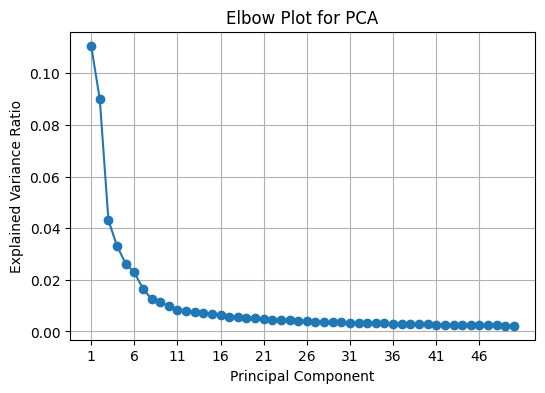

In [4]:
import matplotlib.pyplot as plt
import numpy as np
sc.tl.pca(Xadata)
explained_variance_ratio = Xadata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

sc.tl.pca(Xadata, n_comps=21)

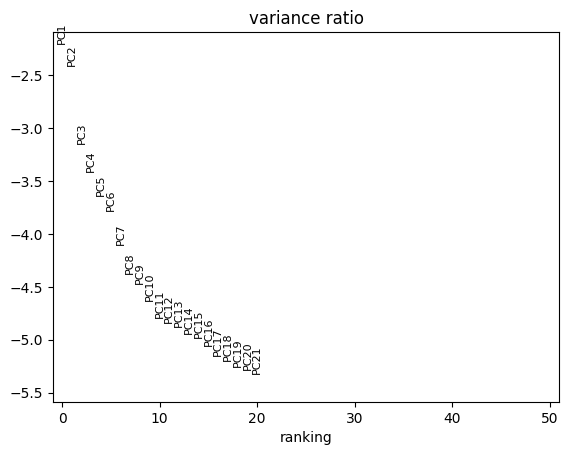

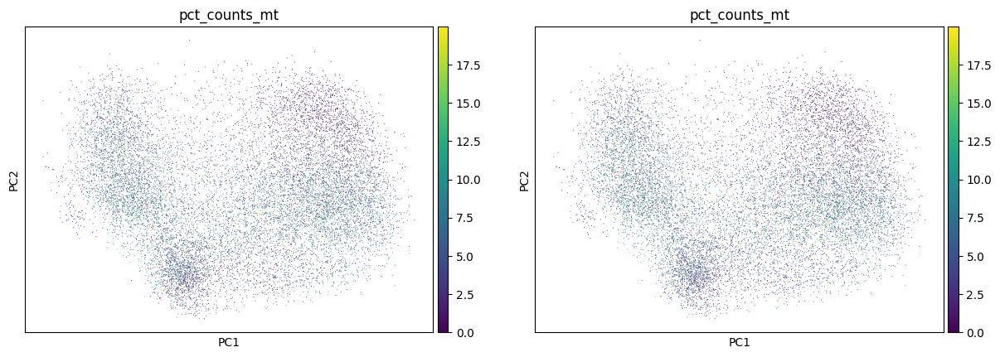

In [5]:
sc.pl.pca_variance_ratio(Xadata, n_pcs=50, log=True)
sc.pl.pca(
    Xadata,
    color=["pct_counts_mt", "pct_counts_mt"],
    ncols=2,
    size=2,
)

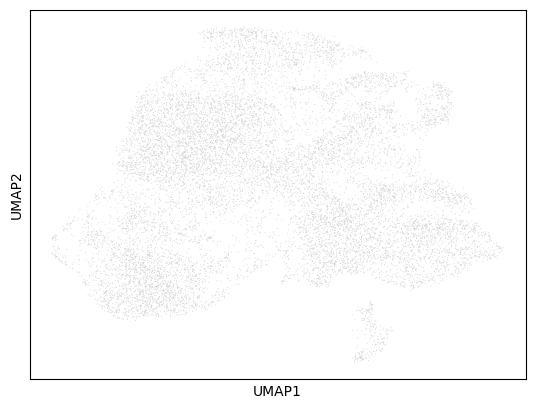

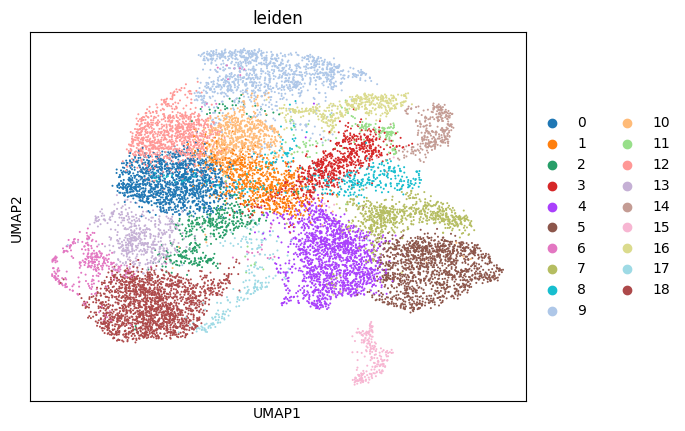

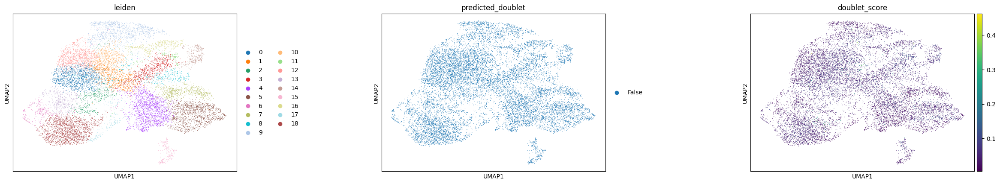

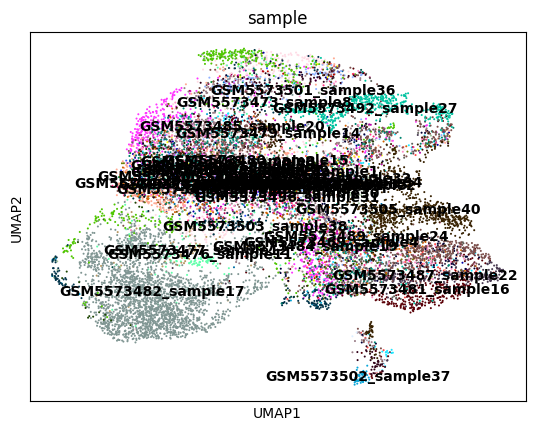

In [6]:
import bbknn 
import scanpy as sc
import scanpy.external as sce
sc.pp.neighbors(Xadata)
sc.tl.leiden(Xadata, flavor="igraph", n_iterations=2)
sc.tl.umap(Xadata)
sc.pl.umap(
    Xadata,
    size=2,
)
sc.pl.umap(Xadata, color=["leiden"])
sc.pl.umap(
    Xadata,
    color=["leiden", "predicted_doublet", "doublet_score"],
    # increase horizontal space between panels
    wspace=0.5,
    size=3,
)
sc.pl.umap(
    Xadata,
    color=['sample'],
    legend_loc="on data",
)

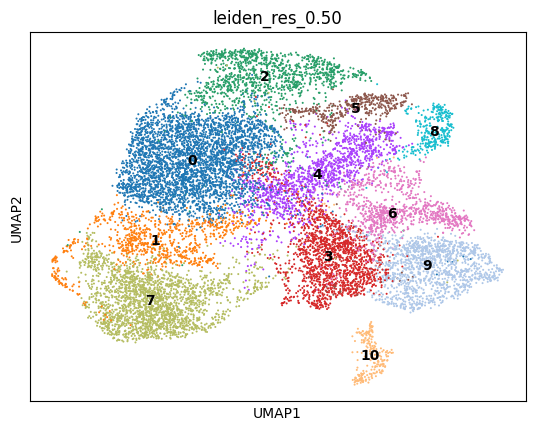

In [7]:
for res in [0.02,0.07, 0.1, 0.25, 0.3,0.5,0.75,1,1.25]:
    sc.tl.leiden(
        Xadata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )
sc.pl.umap(
    Xadata,
    color=["leiden_res_0.50"],
    legend_loc="on data",
)

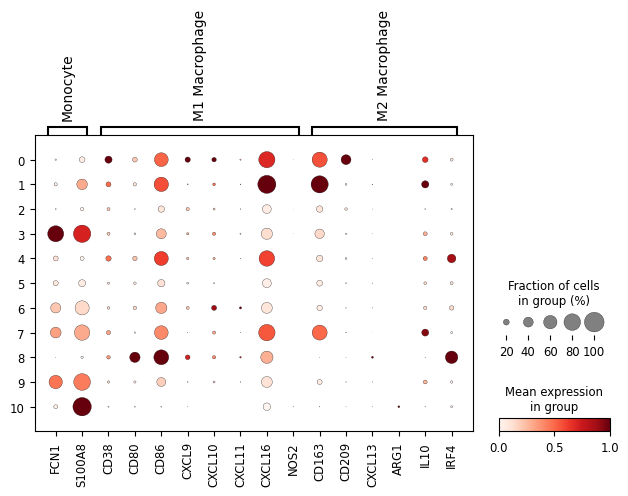

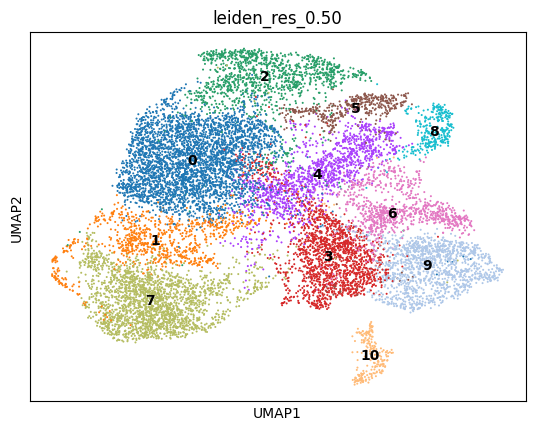

In [8]:
import scanpy as sc

marker_genes = {
    'Monocyte' : ['FCN1','S100A8'],
    "M1 Macrophage": ['CD38','CD80','CD86','CXCL9','CXCL10','CXCL11','CXCL16','NOS2'],
    'M2 Macrophage' : ['CD206','CD163','CD209','CXCL13','VEGF','Fizz1','ARG1','IL10','IRF4']}

existing_genes = {cat: [gene for gene in genes if gene in Xadata.var_names] 
                  for cat, genes in marker_genes.items()}

# 빈 리스트가 아닌 카테고리만 유지
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(Xadata, existing_genes, groupby="leiden_res_0.50", standard_scale="var")

sc.pl.umap(
    Xadata,
    color=["leiden_res_0.50"],
    legend_loc="on data",
)

⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 13967 cells and 25750 genes
🔗 Matching reference genes in the model
🧬 5933 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


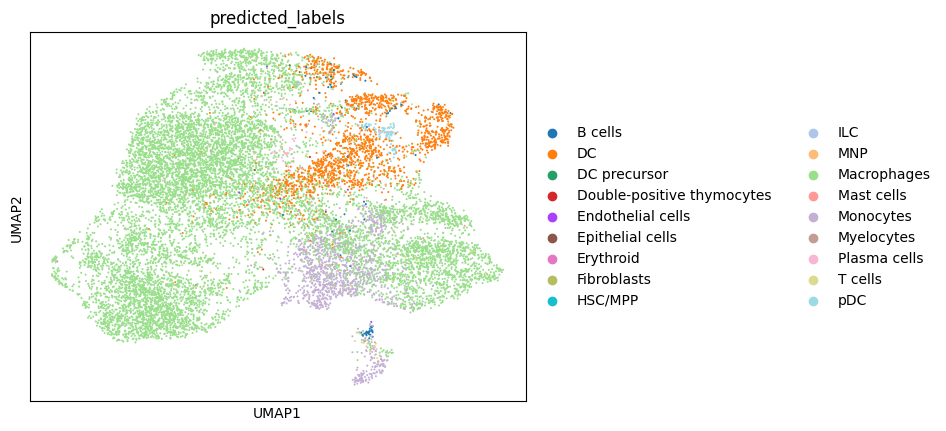

In [9]:
import celltypist

predictions = celltypist.annotate(Xadata, model = 'Immune_All_High.pkl', majority_voting = True)
adata = predictions.to_adata()
sc.pl.umap(Xadata, color = ['predicted_labels'])

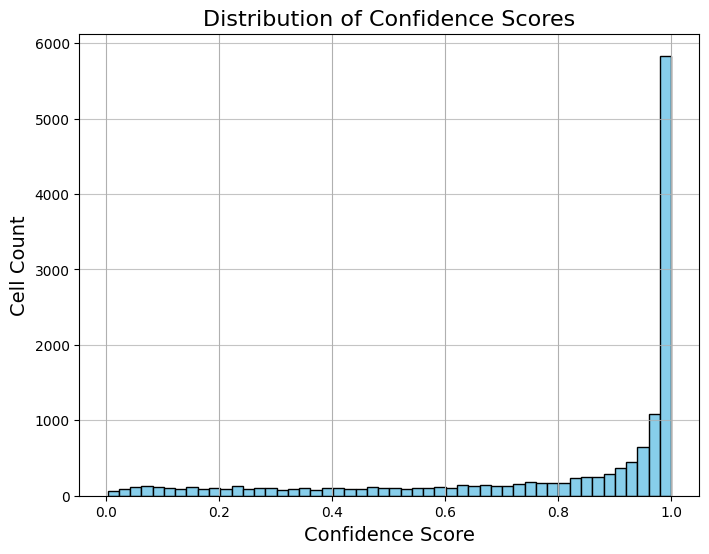

In [10]:
import matplotlib.pyplot as plt

# Check if 'conf_score' exists in Iadata.obs
if 'conf_score' in Xadata.obs:
    # Plot a histogram of conf_score
    plt.figure(figsize=(8, 6))
    Xadata.obs['conf_score'].hist(bins=50, color='skyblue', edgecolor='black')
    plt.title('Distribution of Confidence Scores', fontsize=16)
    plt.xlabel('Confidence Score', fontsize=14)
    plt.ylabel('Cell Count', fontsize=14)
    plt.grid(axis='y', alpha=0.75)
    plt.show()
else:
    print("The 'conf_score' column does not exist in Iadata.obs.")

In [11]:
# 'predicted_labels' 값을 'final'로 복사 (Categorical 컬럼인 경우에도 copy)
Xadata.obs['final'] = Xadata.obs['predicted_labels'].copy()

# 'Unknown' 카테고리를 추가
if hasattr(Xadata.obs['final'].dtype, "categories"):
    Xadata.obs['final'] = Xadata.obs['final'].cat.add_categories(['Unknown'])

# conf_score가 0.6 미만인 경우 'final' 값을 'Unknown'으로 변경
Xadata.obs.loc[Xadata.obs['conf_score'] < 0.0, 'final'] = 'Unknown'

Xadata.obs['final'].value_counts()

final
Macrophages                   10578
DC                             1712
Monocytes                      1269
pDC                              99
Plasma cells                     83
T cells                          82
B cells                          78
ILC                              15
Myelocytes                       14
Epithelial cells                  9
Endothelial cells                 7
Mast cells                        5
DC precursor                      4
Fibroblasts                       4
Double-positive thymocytes        3
Erythroid                         2
MNP                               2
HSC/MPP                           1
Unknown                           0
Name: count, dtype: int64

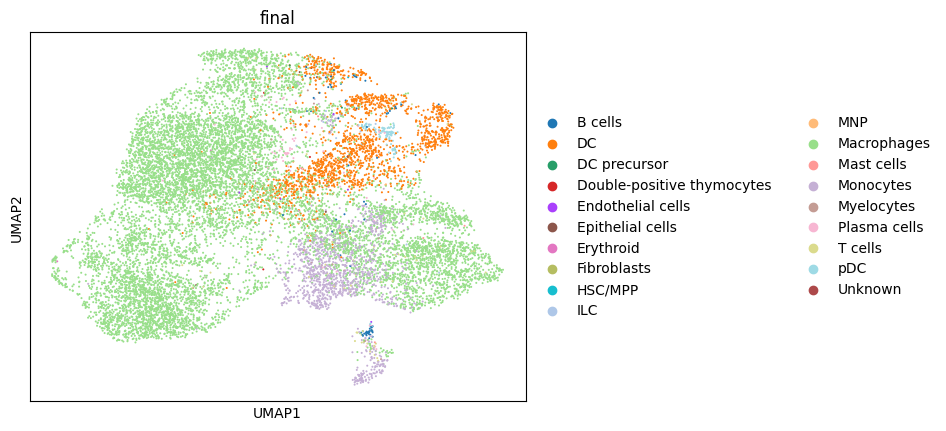

In [12]:
sc.pl.umap(Xadata, color = ['final'])

In [13]:
Xadata = Xadata[Xadata.obs['majority_voting'] == 'Macrophages'].copy()
Xadata.X = Xadata.layers["counts"]
Xadata.write("/home/Data_Drive_8TB/kykim/GC/Macrophage.h5ad")

In [4]:
predict = sc.read_h5ad("/home/Data_Drive_8TB/kykim/GC/predict_raw.h5ad")

In [18]:
import pandas as pd# 덮어쓸 값 준비 (str로 변환하여 category 문제 회피)
new_labels = predict.obs['final_celltype'].astype(str)

# 공통 인덱스 계산
common_idx = Xadata.obs_names.intersection(new_labels.index)

# 기존 'final'을 string으로 임시 변환 (카테고리 문제 우회)
Xadata.obs['final'] = Xadata.obs['final'].astype(str)

# 겹치는 인덱스만 덮어쓰기
Xadata.obs.loc[common_idx, 'final'] = new_labels.loc[common_idx].values

# 다시 categorical로 변환 (선택)
Xadata.obs['final'] = pd.Categorical(Xadata.obs['final'])


In [19]:
# 유지할 세포 타입 목록
keep_types = ['Macrophages', 'M2', 'M1', 'DC', 'Monocytes']

# 나머지는 'Other cell'로 변경
Xadata.obs['final'] = Xadata.obs['final'].apply(lambda x: x if x in keep_types else 'Other cell')

# 다시 Categorical로 변환 (선택 사항이지만 시각화 등에 유리)
Xadata.obs['final'] = pd.Categorical(Xadata.obs['final'], categories=keep_types + ['Other cell'])

Xadata.obs['final'].value_counts()

final
Macrophages    4529
M2             3095
M1             2717
Monocytes       247
DC              117
Other cell       45
Name: count, dtype: int64

In [20]:
# 카테고리 추가
if pd.api.types.is_categorical_dtype(Xadata.obs['final']):
    Xadata.obs['final'] = Xadata.obs['final'].cat.add_categories(['other Macrophages'])

# 해당 값만 변경
Xadata.obs.loc[Xadata.obs['final'] == 'Macrophages', 'final'] = 'other Macrophages'


/tmp/ipykernel_716104/2859525247.py:2: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(Xadata.obs['final']):


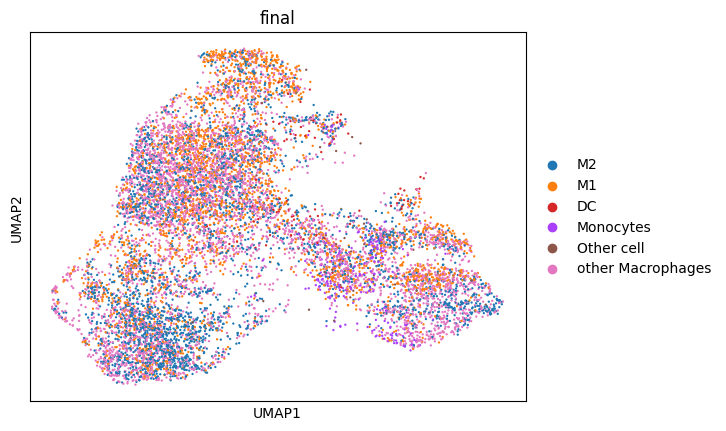

final
other Macrophages    4529
M2                   3095
M1                   2717
Monocytes             247
DC                    117
Other cell             45
Name: count, dtype: int64

In [22]:
# 사용되지 않는 카테고리 제거
import scanpy.external as sce

Xadata.obs['final'] = Xadata.obs['final'].cat.remove_unused_categories()
sce.pp.bbknn(Xadata, batch_key='sample')
sc.pl.umap(Xadata, color = ['final'])
Xadata.obs['final'].value_counts()

In [2]:
Xadata.X = Xadata.layers['counts']
Xadata.write("/home/Data_Drive_8TB/kykim/GC/Final_Macrophage.h5ad")

NameError: name 'Xadata' is not defined

In [1]:
import scanpy as sc

# 경로 설정
adata_path = "/home/Data_Drive_8TB/kykim/GC/predict_raw.h5ad" 

# 파일 불러오기
predict = sc.read_h5ad(adata_path)


In [2]:
predict

AnnData object with n_obs × n_vars = 6253 × 25750
    obs: 'sample', 'cell_type', 'type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'predict', 'M1_score', 'M2_score', 'final_celltype'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'

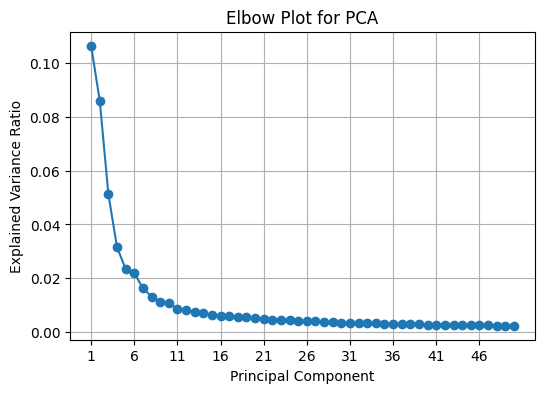

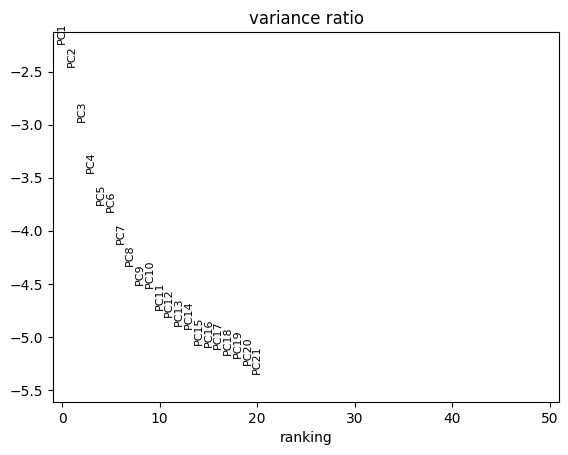

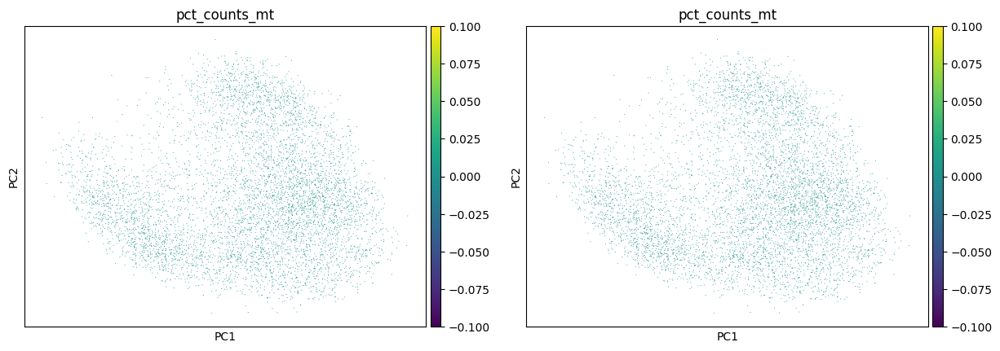

In [3]:
import matplotlib.pyplot as plt
import numpy as np
sc.pp.normalize_total(predict)
sc.pp.log1p(predict)
sc.tl.pca(predict)
explained_variance_ratio = predict.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

sc.tl.pca(predict, n_comps=21)
sc.pl.pca_variance_ratio(predict, n_pcs=50, log=True)
sc.pl.pca(
    predict,
    color=["pct_counts_mt", "pct_counts_mt"],
    ncols=2,
    size=2,
)

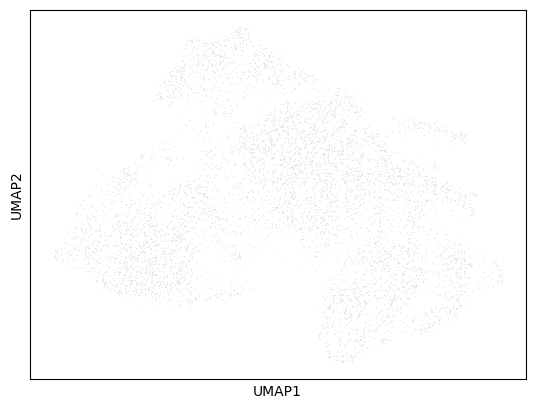

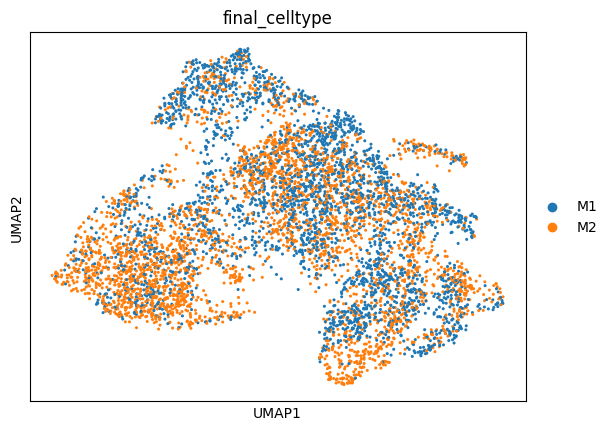

In [4]:
import bbknn 
import scanpy as sc
import scanpy.external as sce


sc.pp.neighbors(predict)
sc.tl.leiden(predict, flavor="igraph", n_iterations=2)
sc.tl.umap(predict)
sce.pp.bbknn(predict, batch_key='final_celltype')
sc.pl.umap(
    predict,
    size=2,
)
sc.pl.umap(predict, color=["final_celltype"])

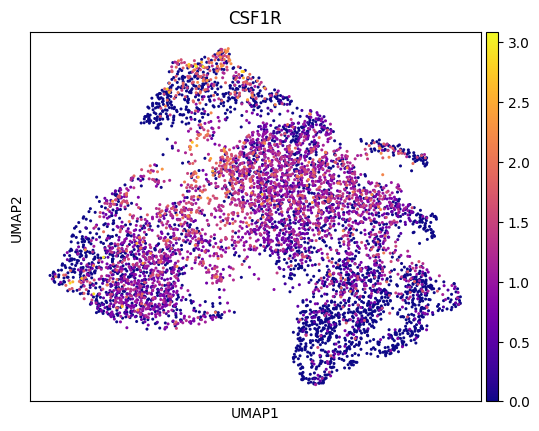

In [5]:
import scanpy as sc# CD44 발현
sc.pl.umap(predict, color=['CSF1R'], cmap="plasma")


In [1]:
import scanpy as sc
adata = sc.read_h5ad('/home/Data_Drive_8TB/kykim/GC/checkpoint_data.h5ad')

In [2]:
adata.X = adata.layers['counts']

In [2]:
import pandas as pd

# gene names는 columns, cell names는 index로 사용
expr_df = pd.DataFrame(adata.X, index=adata.obs_names, columns=adata.var_names)
expr_df

,AL627309.1,AL669831.5,FAM87B,LINC00115,FAM41C,AL645608.3,AL645608.1,SAMD11,NOC2L,KLHL17,...,AC005962.1,AC005828.3,AC103810.5,AC012123.1,ITCH-AS1,FUT5,AC020913.1,AC011443.1,AP000355.1,AP001596.2
AAACCTGAGGCTACGA_8,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.189223,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGAGGTTCCTA_8,0.0,0.0,0.0,0.662802,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGGTTGACGTT_8,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGTCCATGAAC_8,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGGGAGTGTACGG_8,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.680307,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTGAGCTCC.1_40,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGGTTTCACCTCGT.1_40,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGGTTTCTTCCCAG.1_40,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGCAGACACAG.1_40,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
from anndata import AnnData

# 1. 공통된 세포만 추출
common_cells = predict.obs_names.intersection(adata.obs_names)

# 2. adata에서 해당 세포만 서브셋
adata_sub = adata[common_cells, :].copy()

# 3. 새로운 AnnData 생성 (predict와 동일한 obs, adata의 모든 유전자/발현값)
predict_new = AnnData(
    X=adata_sub.X,
    obs=predict.obs.loc[common_cells],  # predict의 obs만 유지
    var=adata.var.copy(),               # adata의 모든 유전자 정보
)

# 필요한 경우 predict의 다른 메타데이터도 추가할 수 있음


In [30]:
predict_new.write("/home/Data_Drive_8TB/kykim/GC/predict_raw.h5ad")

In [33]:
expr_df = pd.DataFrame(predict_new.X, index=predict_new.obs_names, columns=predict_new.var_names)
expr_df.max()

AL627309.1    1
AL669831.5    2
FAM87B        1
LINC00115     3
FAM41C        1
             ..
FUT5          0
AC020913.1    1
AC011443.1    0
AP000355.1    0
AP001596.2    0
Length: 25750, dtype: int64

In [2]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/GC/predict_raw.h5ad")
adata

AnnData object with n_obs × n_vars = 6253 × 25750
    obs: 'sample', 'cell_type', 'type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'predict', 'M1_score', 'M2_score', 'final_celltype'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'

In [3]:
Fibro = adata[adata.obs['cluster'] == 'Fibroblast'].copy()
Fibro.obs

,sample,status,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,pct_counts_mt,...,leiden_res_0.02,leiden_res_0.10,leiden_res_0.25,leiden_res_0.30,leiden_res_0.50,cluster,predicted_labels,over_clustering,majority_voting,conf_score
AAAGCAATCCGGGTGT_8,GSM5573466_sample1,Normal,2728,8464,27.776465,39.732987,51.996692,66.753308,781,9.227316,...,0,7,10,6,15,Fibroblast,Fibroblasts,97,Fibroblasts,0.999817
AAAGTAGGTAGCCTCG_8,GSM5573466_sample1,Normal,1914,4074,25.012273,34.781541,45.655376,62.592047,175,4.295533,...,0,7,10,6,16,Fibroblast,DC,369,Fibroblasts,0.050836
AACGTTGAGATCTGAA_8,GSM5573466_sample1,Normal,2015,5468,27.414045,39.264813,52.231163,68.672275,433,7.918800,...,0,7,10,6,15,Fibroblast,Fibroblasts,204,Fibroblasts,0.029387
AAGCCGCCATGCAACT_8,GSM5573466_sample1,Normal,2552,7600,34.013158,43.171053,53.157895,67.736842,852,11.210526,...,0,7,10,6,15,Fibroblast,Fibroblasts,97,Fibroblasts,0.093688
AATCGGTAGAACAATC_8,GSM5573466_sample1,Normal,2414,7245,29.468599,41.463078,54.202899,69.013112,673,9.289165,...,0,7,10,6,15,Fibroblast,Fibroblasts,265,Fibroblasts,0.997322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTGTTCAAGTGCTT.1_40,GSM5573505_sample40,Tumor,4158,26939,37.751958,48.561565,59.779502,73.091058,2508,9.309922,...,0,7,10,6,15,Fibroblast,Macrophages,152,Fibroblasts,0.998929
TTGTGTTCATGGGCAA.1_40,GSM5573505_sample40,Tumor,1530,4730,37.970402,49.133192,61.479915,77.336152,579,12.241015,...,0,7,10,6,15,Fibroblast,Fibroblasts,152,Fibroblasts,0.603882
TTTAGTCAGAGGATGA.1_40,GSM5573505_sample40,Tumor,2790,8387,26.994158,37.057351,49.087874,64.754978,816,9.729343,...,0,7,10,6,15,Fibroblast,Fibroblasts,152,Fibroblasts,0.087387
TTTATGCGTAGAGACC.1_40,GSM5573505_sample40,Tumor,3171,10752,34.151786,45.191592,54.947917,67.122396,1249,11.616443,...,0,7,10,6,15,Fibroblast,Fibroblasts,152,Fibroblasts,0.775256


In [4]:
Fibro.X = Fibro.layers["counts"]
print(Fibro.X)

[[0 1 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [5]:
sc.pp.normalize_total(Fibro)
sc.pp.log1p(Fibro)

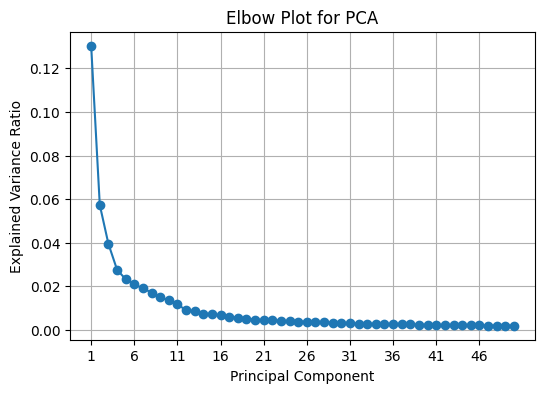

In [6]:
import matplotlib.pyplot as plt
import numpy as np

sc.tl.pca(Fibro)
explained_variance_ratio = Fibro.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

sc.tl.pca(Fibro, n_comps=21)

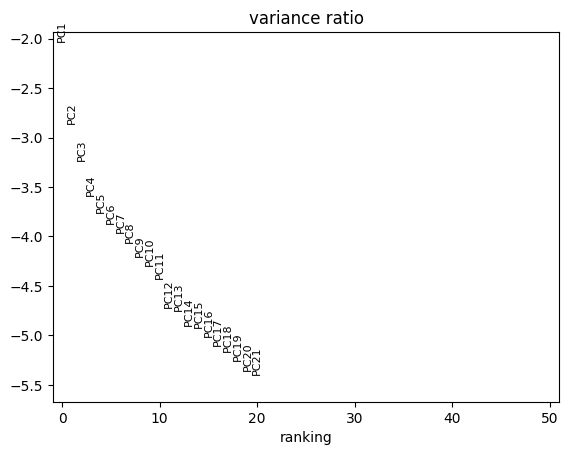

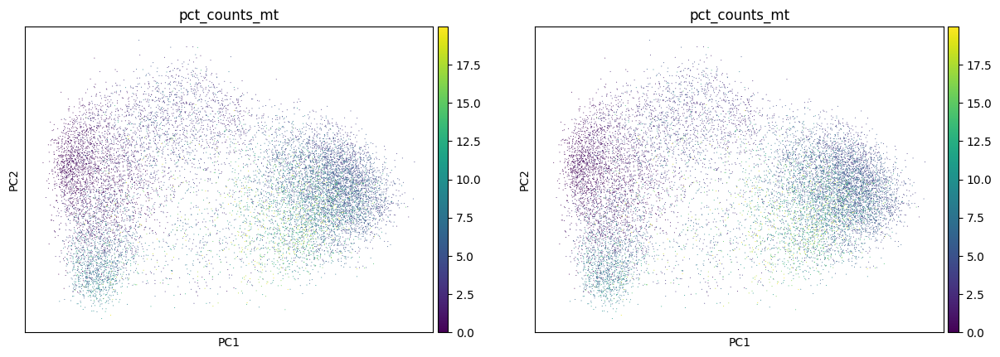

In [7]:
sc.pl.pca_variance_ratio(Fibro, n_pcs=50, log=True)
sc.pl.pca(
    Fibro,
    color=["pct_counts_mt", "pct_counts_mt"],
    ncols=2,
    size=2,
)

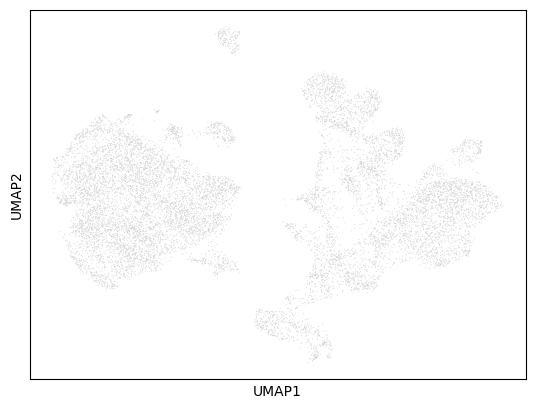

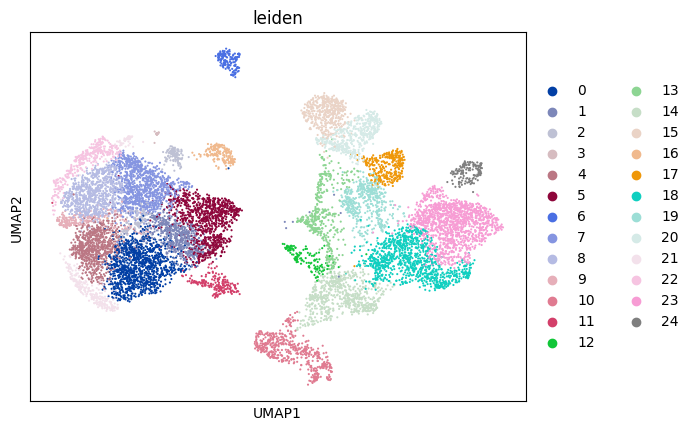

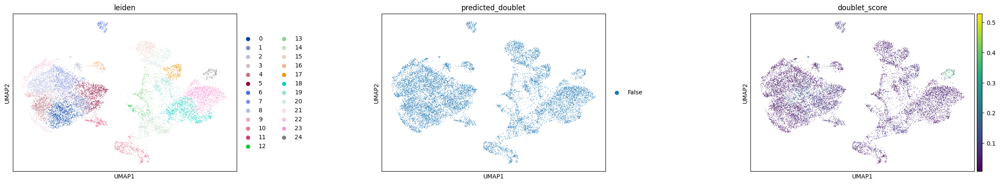

In [8]:
import bbknn 
import scanpy as sc
import scanpy.external as sce


sc.pp.neighbors(Fibro)
sc.tl.leiden(Fibro, flavor="igraph", n_iterations=2)
sc.tl.umap(Fibro)
sc.pl.umap(
    Fibro,
    size=2,
)
sc.pl.umap(Fibro, color=["leiden"])
sc.pl.umap(
    Fibro,
    color=["leiden", "predicted_doublet", "doublet_score"],
    # increase horizontal space between panels
    wspace=0.5,
    size=3,
)


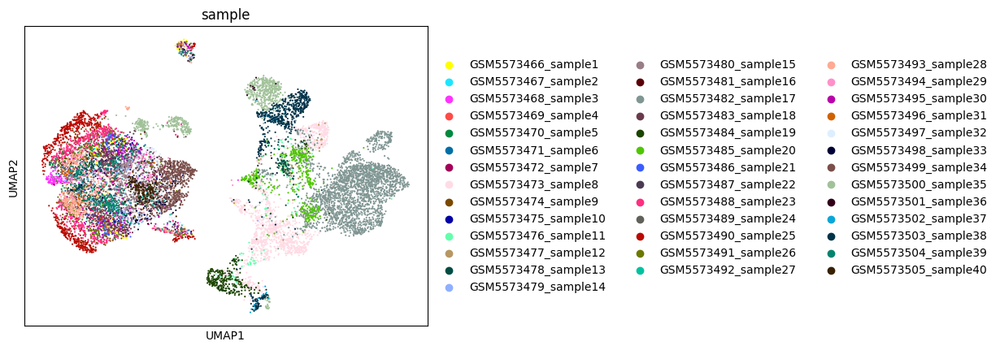

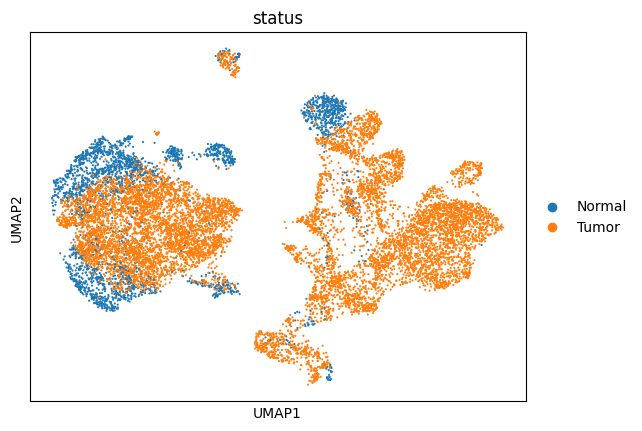

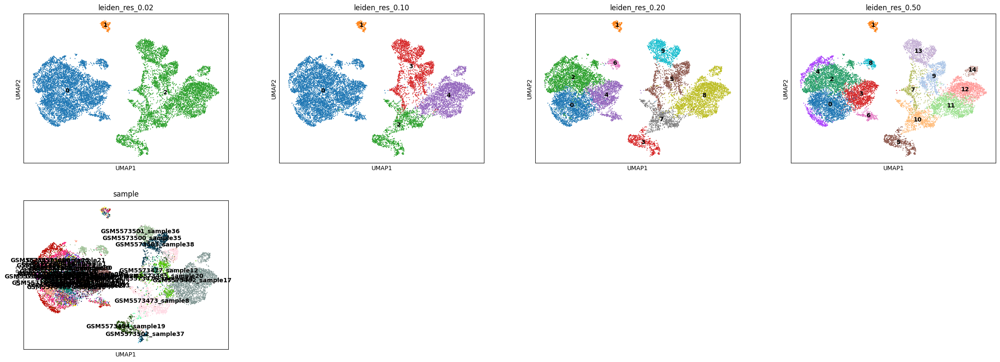

In [9]:
sc.pl.umap(
    Fibro,
    color=['sample']
)
sc.pl.umap(
    Fibro,
    color=['status']
)
for res in [0.02, 0.1, 0.20, 0.4,0.5]:
    sc.tl.leiden(
        Fibro, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )
sc.pl.umap(
    Fibro,
    color=["leiden_res_0.02", "leiden_res_0.10","leiden_res_0.20","leiden_res_0.50",'sample'],
    legend_loc="on data",
)

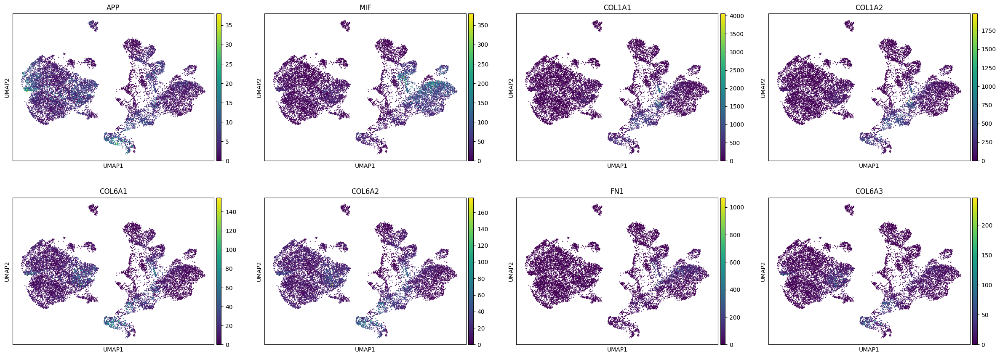

In [23]:
sc.pp.normalize_total(Fibro)
sc.pp.log1p(Fibro)  # log(1 + x)

# UMAP 시각화
sc.pl.umap(
    Fibro,
    color=['APP', 'MIF', 'COL1A1', 'COL1A2', 'COL6A1', 'COL6A2', 'FN1', 'COL6A3'],
    legend_loc="on data",
)

Cluster 0: ['CYGB', 'A2M', 'TCF21', 'FOXF1', 'PTGER2', 'FENDRR', 'TMEM176B', 'FGFR4', 'EDNRB', 'EMID1']
Cluster 1: ['CRYAB', 'NRXN1', 'LGI4', 'GPM6B', 'S100B', 'CDH19', 'SEMA3B', 'SORBS2', 'ANK3', 'PLP1']
Cluster 2: ['COL14A1', 'COL1A2', 'COL1A1', 'MGP', 'COL3A1', 'PRRX1', 'BOC', 'NFIB', 'PRICKLE1', 'LRP1']
Cluster 3: ['KLK11', 'CALB2', 'EZR', 'IL18', 'ALDH1A2', 'PTPRF', 'RPS2', 'REC8', 'KRT19', 'MZT2B']
Cluster 4: ['RPL17', 'RPL10', 'MIF', 'RPL8', 'RPL12', 'RPS3A', 'ALDOA', 'RPL29', 'RPS8', 'RPL18A']


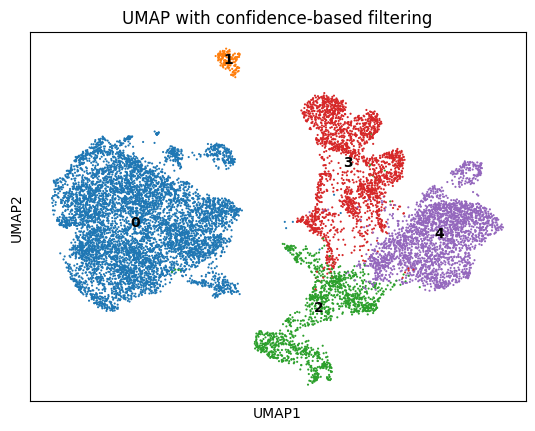

In [47]:
import scanpy as sc
sc.tl.rank_genes_groups(Fibro, groupby='leiden_res_0.10', method='t-test')  # 또는 'wilcoxon'
# 각 클러스터별 상위 10개 유전자 추출
top_genes = {}

groups = Fibro.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들

for group in groups:
    genes = Fibro.uns['rank_genes_groups']['names'][group][:10]
    top_genes[group] = genes.tolist()

# 결과 확인
for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    Fibro,
    color='leiden_res_0.10',
    title='UMAP with confidence-based filtering',
    legend_loc='on data'  # 또는 'right margin', 'none'
)


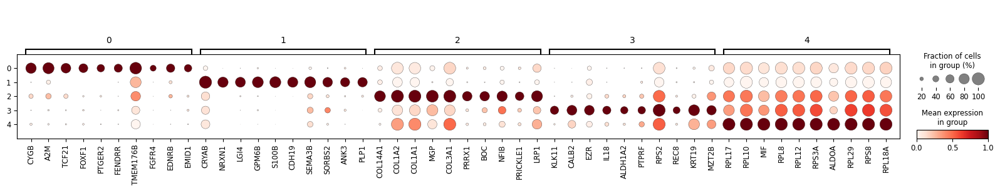

In [48]:
import scanpy as sc

marker_genes = {
    '0' : ['CYGB', 'A2M', 'TCF21', 'FOXF1', 'PTGER2', 'FENDRR', 'TMEM176B', 'FGFR4', 'EDNRB', 'EMID1'],
    "1": ['CRYAB', 'NRXN1', 'LGI4', 'GPM6B', 'S100B', 'CDH19', 'SEMA3B', 'SORBS2', 'ANK3', 'PLP1'],
    "2": ['COL14A1', 'COL1A2', 'COL1A1', 'MGP', 'COL3A1', 'PRRX1', 'BOC', 'NFIB', 'PRICKLE1', 'LRP1'],
    '3' : ['KLK11', 'CALB2', 'EZR', 'IL18', 'ALDH1A2', 'PTPRF', 'RPS2', 'REC8', 'KRT19', 'MZT2B'],
    '4' : ['RPL17', 'RPL10', 'MIF', 'RPL8', 'RPL12', 'RPS3A', 'ALDOA', 'RPL29', 'RPS8', 'RPL18A']
}

existing_genes = {cat: [gene for gene in genes if gene in Fibro.var_names] 
                  for cat, genes in marker_genes.items()}

# 빈 리스트가 아닌 카테고리만 유지
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(Fibro, existing_genes, groupby="leiden_res_0.10", standard_scale="var")
    

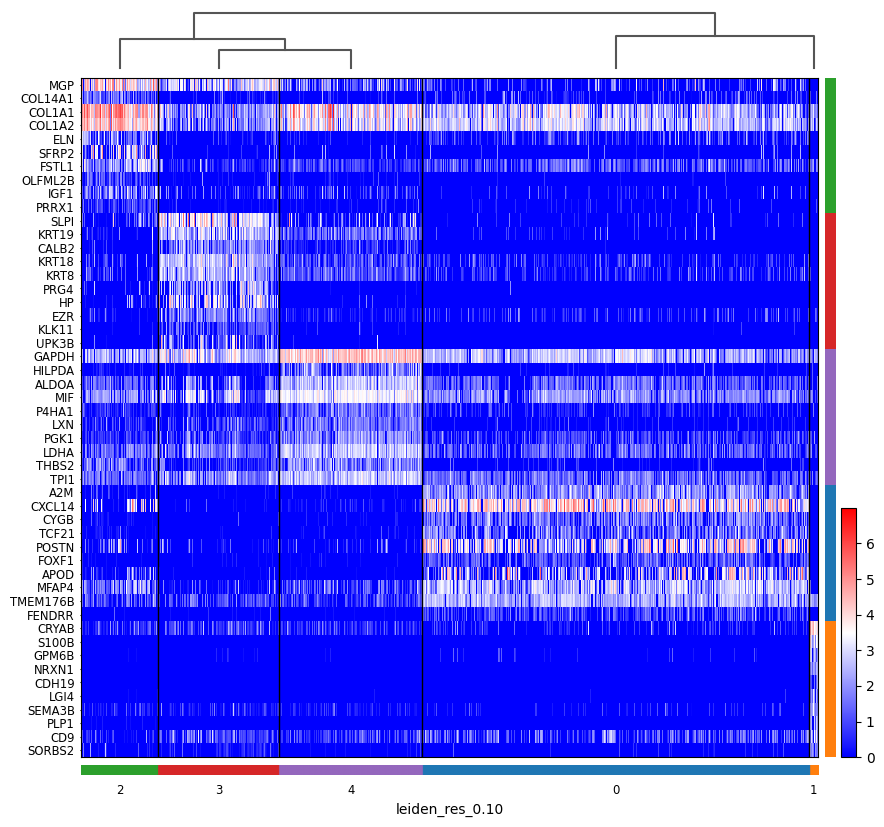

In [39]:
import scanpy as sc

# 차등 발현 유전자 분석 (전체 클러스터 간)
sc.tl.rank_genes_groups(
    Fibro,
    groupby='leiden_res_0.10',
    method='wilcoxon',
    n_genes=10
)

# 히트맵 시각화 (각 클러스터별 top 10 유전자)
sc.pl.rank_genes_groups_heatmap(
    Fibro,
    groupby='leiden_res_0.10',
    n_genes=10,
    show=True,
    cmap='bwr',  # 빨파색으로 fold change 표현
    use_raw=False,  # raw가 없으면 False로 변경
    dendrogram=True,  # 유전자/클러스터 계층적 군집화
    swap_axes=True,   # 유전자 x 축, 클러스터 y 축
)


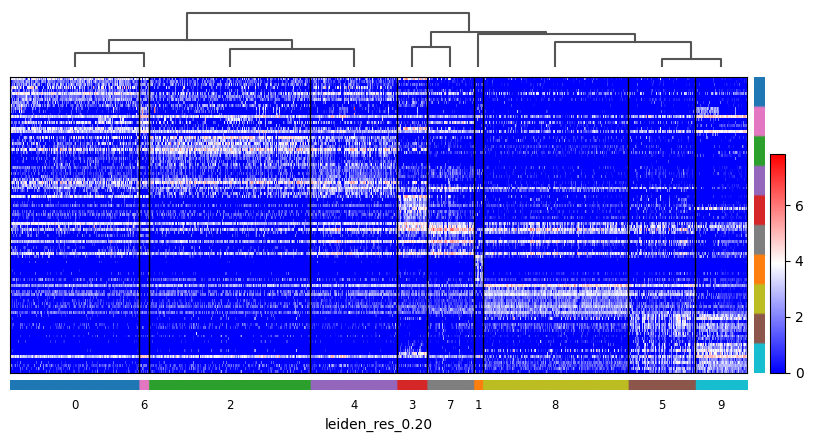

In [10]:
import scanpy as sc

# 차등 발현 유전자 분석 (전체 클러스터 간)
sc.tl.rank_genes_groups(
    Fibro,
    groupby='leiden_res_0.20',
    method='wilcoxon',
    n_genes=10
)

# 히트맵 시각화 (각 클러스터별 top 10 유전자)
sc.pl.rank_genes_groups_heatmap(
    Fibro,
    groupby='leiden_res_0.20',
    n_genes=10,
    show=True,
    cmap='bwr',  # 빨파색으로 fold change 표현
    use_raw=False,  # raw가 없으면 False로 변경
    dendrogram=True,  # 유전자/클러스터 계층적 군집화
    swap_axes=True,   # 유전자 x 축, 클러스터 y 축
)


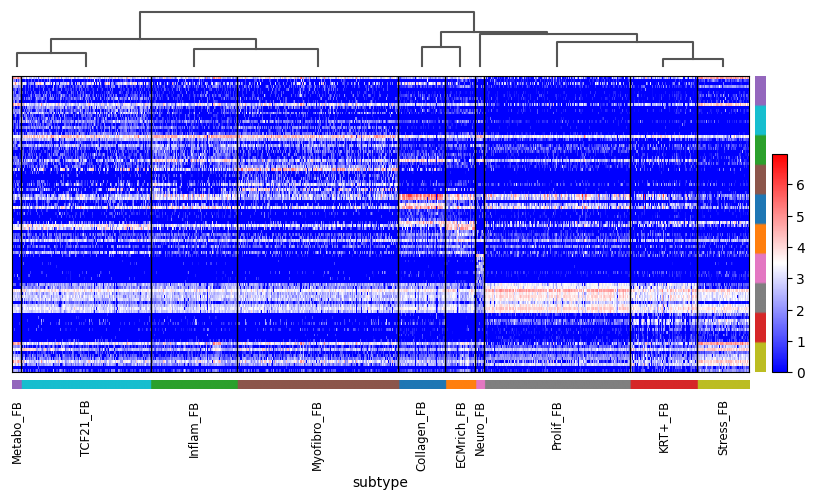

In [32]:
Fibro.X = Fibro.layers['counts']
sc.pp.normalize_total(Fibro)
sc.pp.log1p(Fibro)

sc.pl.rank_genes_groups_heatmap(
    Fibro,
    groupby='subtype',
    n_genes=10,
    show=True,
    cmap='bwr',  # 빨파색으로 fold change 표현
    use_raw=False,  # raw가 없으면 False로 변경
    dendrogram=True,  # 유전자/클러스터 계층적 군집화
    swap_axes=True,   # 유전자 x 축, 클러스터 y 축
)


Cluster Collagen_FB: ['COL1A1', 'COL1A2', 'COL14A1', 'BGN', 'COL3A1', 'PRICKLE1', 'COL16A1', 'NID2', 'OLFML2B', 'MGP']
Cluster ECMrich_FB: ['DCN', 'CFD', 'FBLN2', 'FSTL1', 'LRP1', 'CST3', 'TSHZ2', 'PCOLCE', 'PRRX1', 'FBLN1']
Cluster Inflam_FB: ['B2M', 'TMEM176B', 'EMID1', 'TMEM176A', 'PDPN', 'F2R', 'COL12A1', 'COL4A2', 'IGFBP7', 'LAMA4']
Cluster KRT+_FB: ['CALB2', 'REC8', 'KRT19', 'KRT8', 'KLK11', 'EZR', 'ASPHD1', 'ALDH1A2', 'CXADR', 'SLC9A3R1']
Cluster Metabo_FB: ['MT-ATP6', 'XIST', 'APOE', 'CD81', 'BARX1', 'CRYBG3', 'NR2F1', 'ABCA8', 'INTS6', 'MT-ND4']
Cluster Myofibro_FB: ['PDGFRA', 'POSTN', 'TSPAN12', 'ENHO', 'VSTM2A', 'PDGFD', 'PLAT', 'PROM1', 'APOD', 'NSG1']
Cluster Neuro_FB: ['CRYAB', 'NRXN1', 'LGI4', 'GPM6B', 'S100B', 'CDH19', 'SEMA3B', 'SORBS2', 'ANK3', 'PLP1']
Cluster Prolif_FB: ['RPL17', 'MIF', 'RPL10', 'RPL8', 'RPL12', 'RPS3A', 'ALDOA', 'RPL29', 'RPS8', 'RPL18A']
Cluster Stress_FB: ['MT-ATP6', 'RPS10', 'RPL41', 'MZT2B', 'RPS20', 'RPS11', 'MT-ND4', 'RPL13A', 'KLK11', 'CD81']

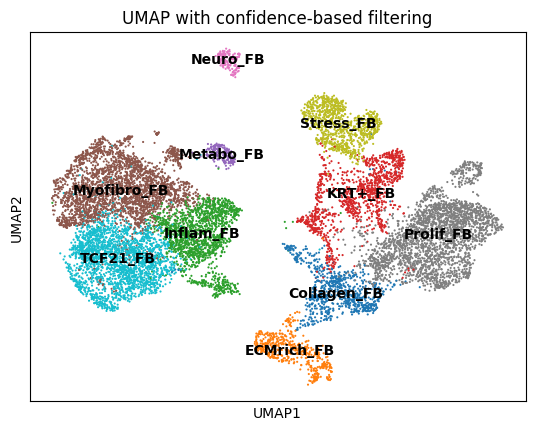

In [30]:
import scanpy as sc
sc.tl.rank_genes_groups(Fibro, groupby='subtype', method='t-test')  # 또는 'wilcoxon'
# 각 클러스터별 상위 10개 유전자 추출
top_genes = {}

groups = Fibro.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들

for group in groups:
    genes = Fibro.uns['rank_genes_groups']['names'][group][:10]
    top_genes[group] = genes.tolist()

# 결과 확인
for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    Fibro,
    color='subtype',
    title='UMAP with confidence-based filtering',
    legend_loc='on data'  # 또는 'right margin', 'none'
)


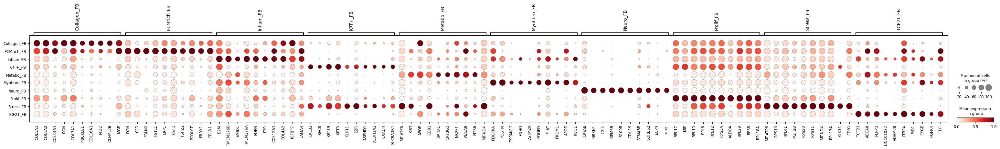

In [37]:
import scanpy as sc

marker_genes = {
    'Collagen_FB': ['COL1A1', 'COL1A2', 'COL14A1', 'BGN', 'COL3A1', 'PRICKLE1', 'COL16A1', 'NID2', 'OLFML2B', 'MGP'],
    'ECMrich_FB': ['DCN', 'CFD', 'FBLN2', 'FSTL1', 'LRP1', 'CST3', 'TSHZ2', 'PCOLCE', 'PRRX1', 'FBLN1'],
    'Inflam_FB': ['B2M', 'TMEM176B', 'EMID1', 'TMEM176A', 'PDPN', 'F2R', 'COL12A1', 'COL4A2', 'IGFBP7', 'LAMA4'],
    'KRT+_FB': ['CALB2', 'REC8', 'KRT19', 'KRT8', 'KLK11', 'EZR', 'ASPHD1', 'ALDH1A2', 'CXADR', 'SLC9A3R1'],
    'Metabo_FB': ['MT-ATP6', 'XIST', 'APOE', 'CD81', 'BARX1', 'CRYBG3', 'NR2F1', 'ABCA8', 'INTS6', 'MT-ND4'],
    'Myofibro_FB': ['PDGFRA', 'POSTN', 'TSPAN12', 'ENHO', 'VSTM2A', 'PDGFD', 'PLAT', 'PROM1', 'APOD', 'NSG1'],
    'Neuro_FB': ['CRYAB', 'NRXN1', 'LGI4', 'GPM6B', 'S100B', 'CDH19', 'SEMA3B', 'SORBS2', 'ANK3', 'PLP1'],    
    'Prolif_FB': ['RPL17', 'MIF', 'RPL10', 'RPL8', 'RPL12', 'RPS3A', 'ALDOA', 'RPL29', 'RPS8', 'RPL18A'],
    'Stress_FB': ['MT-ATP6', 'RPS10', 'RPL41', 'MZT2B', 'RPS20', 'RPS11', 'MT-ND4', 'RPL13A', 'KLK11', 'CD81'],
    'TCF21_FB': ['TCF21', 'ABCA8', 'PLPP3', 'LINC01082', 'ADAM28', 'LTBP4', 'PID1', 'CYGB', 'FGFR4', 'TFPI']
}
# 실제 존재하는 유전자만 필터링
existing_genes = {
    cat: [gene for gene in genes if gene in Fibro.var_names]
    for cat, genes in marker_genes.items()
}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

# 저장 디렉토리 지정
# sc.settings.figdir = "/home/Data_Drive_8TB/kykim/GC"

# # dotplot 생성 및 저장
sc.pl.dotplot(
    Fibro,
    existing_genes,
    groupby="subtype",
    standard_scale="var",
)


In [38]:
print(Fibro.obs['subtype'].value_counts())

subtype
Myofibro_FB    2791
Prolif_FB      2515
TCF21_FB       2235
Inflam_FB      1496
KRT+_FB        1160
Stress_FB       902
Collagen_FB     809
ECMrich_FB      520
Metabo_FB       169
Neuro_FB        153
Name: count, dtype: int64


In [46]:
Fibro.write("/home/Data_Drive_8TB/kykim/GC/Fibroblast.h5ad")

In [63]:
import scanpy as sc
Fibro = sc.read_h5ad("/home/Data_Drive_8TB/kykim/GC/Fibroblast.h5ad")

In [14]:
# 클러스터 ID와 간단한 cluster명 매핑 딕셔너리
cluster_names = {
    '0': 'TCF21_FB',
    '1': 'Neuro_FB',
    '2': 'Myofibro_FB',
    '3': 'ECMrich_FB',
    '4': 'Inflam_FB',
    '5': 'KRT+_FB',
    '6': 'Metabo_FB',
    '7': 'Collagen_FB',
    '8': 'Prolif_FB',
    '9': 'Stress_FB'
}

# 문자열로 된 키에 맞춰 현재 클러스터 값도 문자열로 처리
Fibro.obs['subtype'] = Fibro.obs['leiden_res_0.20'].astype(str).map(cluster_names)
Fibro.obs['subtype']

AAAGCAATCCGGGTGT_8          TCF21_FB
AAAGTAGGTAGCCTCG_8          Neuro_FB
AACGTTGAGATCTGAA_8       Myofibro_FB
AAGCCGCCATGCAACT_8          TCF21_FB
AATCGGTAGAACAATC_8       Myofibro_FB
                            ...     
TTGTGTTCAAGTGCTT.1_40      Inflam_FB
TTGTGTTCATGGGCAA.1_40      Inflam_FB
TTTAGTCAGAGGATGA.1_40      Inflam_FB
TTTATGCGTAGAGACC.1_40      Inflam_FB
TTTCATGCATCTGCGG.1_40      Inflam_FB
Name: subtype, Length: 12750, dtype: object

In [131]:
Fibro.obs['leiden_res_0.20'].value_counts()

leiden_res_0.20
2    2791
8    2515
0    2235
4    1496
5    1160
9     902
7     809
3     520
6     169
1     153
Name: count, dtype: int64

In [136]:
Fibro.X = Fibro.layers['counts']
Fibro.write("/home/Data_Drive_8TB/kykim/GC/Fibroblast.h5ad")

... storing 'subtype' as categorical
... storing 'final' as categorical


In [135]:
na_count = adata.obs['final'].isna().sum()

# NA 개수 출력
print(f"NA가 있는 셀 수: {na_count}")
na_count = Fibro.obs['final'].isna().sum()

# NA 개수 출력
print(f"NA가 있는 셀 수: {na_count}")

NA가 있는 셀 수: 0
NA가 있는 셀 수: 0


In [134]:
Fibro.obs['final'] = Fibro.obs['subtype']
Fibro.obs

,sample,status,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,pct_counts_mt,...,leiden_res_0.02,leiden_res_0.10,leiden_res_0.25,leiden_res_0.30,leiden_res_0.50,cluster,leiden_res_0.20,leiden_res_0.40,subtype,final
AAAGCAATCCGGGTGT_8,GSM5573466_sample1,Normal,2728,8464,27.776465,39.732987,51.996692,66.753308,781,9.227316,...,0,0,10,6,0,Fibroblast,0,0,TCF21_FB,TCF21_FB
AAAGTAGGTAGCCTCG_8,GSM5573466_sample1,Normal,1914,4074,25.012273,34.781541,45.655376,62.592047,175,4.295533,...,1,1,10,6,1,Fibroblast,1,1,Neuro_FB,Neuro_FB
AACGTTGAGATCTGAA_8,GSM5573466_sample1,Normal,2015,5468,27.414045,39.264813,52.231163,68.672275,433,7.918800,...,0,0,10,6,2,Fibroblast,2,2,Myofibro_FB,Myofibro_FB
AAGCCGCCATGCAACT_8,GSM5573466_sample1,Normal,2552,7600,34.013158,43.171053,53.157895,67.736842,852,11.210526,...,0,0,10,6,0,Fibroblast,0,0,TCF21_FB,TCF21_FB
AATCGGTAGAACAATC_8,GSM5573466_sample1,Normal,2414,7245,29.468599,41.463078,54.202899,69.013112,673,9.289165,...,0,0,10,6,2,Fibroblast,2,2,Myofibro_FB,Myofibro_FB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTGTTCAAGTGCTT.1_40,GSM5573505_sample40,Tumor,4158,26939,37.751958,48.561565,59.779502,73.091058,2508,9.309922,...,0,0,10,6,3,Fibroblast,4,4,Inflam_FB,Inflam_FB
TTGTGTTCATGGGCAA.1_40,GSM5573505_sample40,Tumor,1530,4730,37.970402,49.133192,61.479915,77.336152,579,12.241015,...,0,0,10,6,3,Fibroblast,4,4,Inflam_FB,Inflam_FB
TTTAGTCAGAGGATGA.1_40,GSM5573505_sample40,Tumor,2790,8387,26.994158,37.057351,49.087874,64.754978,816,9.729343,...,0,0,10,6,3,Fibroblast,4,4,Inflam_FB,Inflam_FB
TTTATGCGTAGAGACC.1_40,GSM5573505_sample40,Tumor,3171,10752,34.151786,45.191592,54.947917,67.122396,1249,11.616443,...,0,0,10,6,3,Fibroblast,4,4,Inflam_FB,Inflam_FB


In [137]:
import anndata as ad
combined_adata = ad.concat([Fibro, adata], join="inner", axis=0)

In [142]:
combined_adata.obs['final'].value_counts()

final
other Macrophages    4914
M2                   3271
M1                   2982
Myofibro_FB          2791
Prolif_FB            2515
TCF21_FB             2235
Inflam_FB            1496
DC                   1434
KRT+_FB              1160
Monocytes            1041
Stress_FB             902
Collagen_FB           809
ECMrich_FB            520
Other cell            325
Metabo_FB             169
Neuro_FB              153
Name: count, dtype: int64

In [144]:
combined_adata.X = combined_adata.layers['counts']
combined_adata.write("/home/Data_Drive_8TB/kykim/GC/FibroMacro.h5ad")

In [140]:
# NA 값이 있는지 확인
na_count = combined_adata.obs['final'].isna().sum()

# NA 개수 출력
print(f"NA가 있는 셀 수: {na_count}")


NA가 있는 셀 수: 0


In [6]:
import scanpy as sc
Fibro = sc.read_h5ad("/home/Data_Drive_8TB/kykim/GC/Fibroblast.h5ad")

/tmp/ipykernel_3521705/2815191165.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = Fibro.obs.groupby(['status', 'subtype']).size().unstack(fill_value=0)


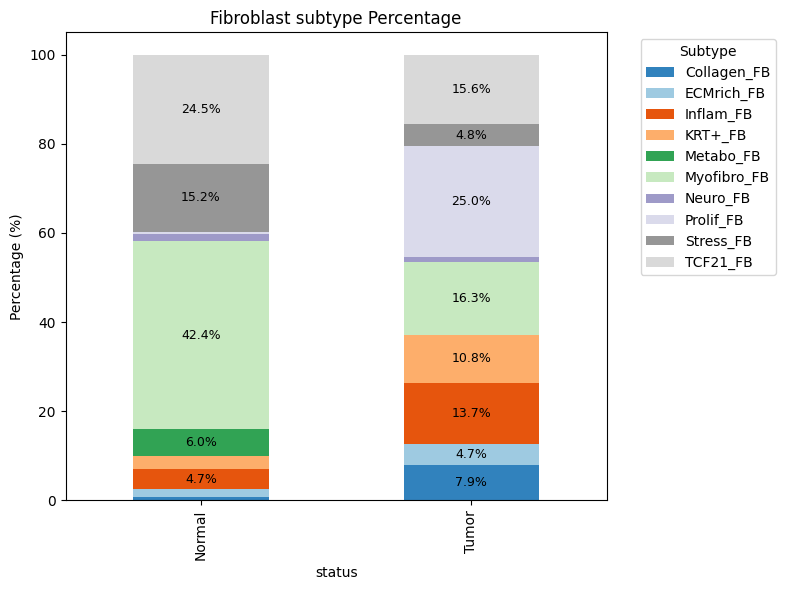

In [26]:
import matplotlib.pyplot as plt

# Count table
count_df = Fibro.obs.groupby(['status', 'subtype']).size().unstack(fill_value=0)

# Percentage table
percent_df = count_df.div(count_df.sum(axis=1), axis=0) * 100

ax = percent_df.plot(kind='bar', stacked=True, figsize=(8, 6), colormap='tab20c')
plt.ylabel('Percentage (%)')
plt.title('Fibroblast subtype Percentage')

# 수치 표기 (percentage 기준)
for i, status in enumerate(count_df.index):
    y_offset = 0
    for subtype in count_df.columns:
        val = percent_df.loc[status, subtype]
        if val > 3:  # 너무 작으면 안 보임
            ax.text(i, y_offset + val / 2, f'{val:.1f}%', ha='center', va='center', fontsize=9, color='Black')
        y_offset += val

plt.legend(title='Subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


/tmp/ipykernel_3521705/490176267.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = Fibro.obs.groupby(['status', 'subtype']).size().unstack(fill_value=0)


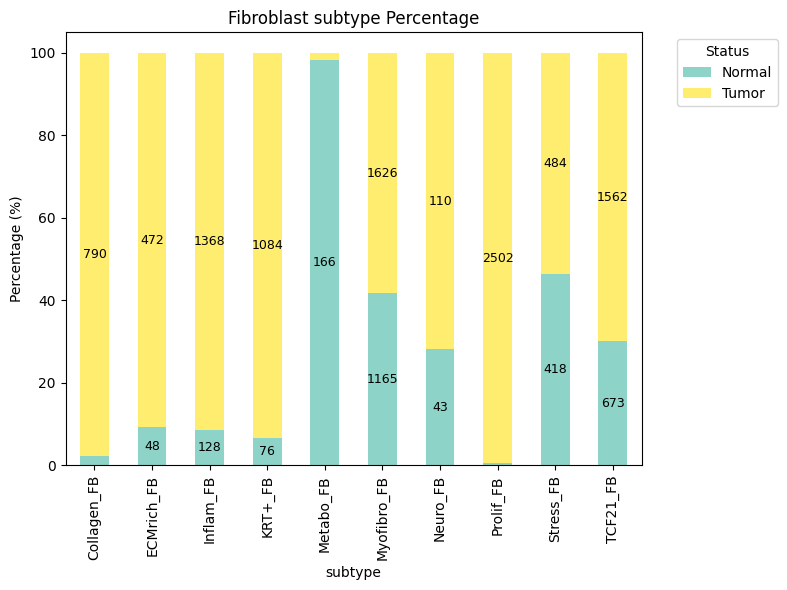

In [24]:
import matplotlib.pyplot as plt

# Count table
count_df = Fibro.obs.groupby(['status', 'subtype']).size().unstack(fill_value=0)

# Transpose so that x-axis is subtype
count_df_t = count_df.T

# Percentage by subtype (i.e., column-wise normalization)
percent_df_t = count_df_t.div(count_df_t.sum(axis=1), axis=0) * 100

ax = percent_df_t.plot(kind='bar', stacked=True, figsize=(8, 6), colormap='Set3')
plt.ylabel('Percentage (%)')
plt.title('Fibroblast subtype Percentage')

# 수치 표기
for i, subtype in enumerate(percent_df_t.index):
    y_offset = 0
    for status in percent_df_t.columns:
        val = percent_df_t.loc[subtype, status]
        count = count_df_t.loc[subtype, status]
        if val > 5:  # 작은 비율은 생략해도 됨
            ax.text(i, y_offset + val / 2, f'{count}', ha='center', va='center', fontsize=9)
        y_offset += val

plt.legend(title='Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


/tmp/ipykernel_2326110/3105428120.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_scores = Fibro.obs.groupby('final')['TF_score'].mean()
/tmp/ipykernel_2326110/3105428120.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(x='final', y='TF_score', data=df, inner=None, cut=0, palette='Set2')
/tmp/ipykernel_2326110/3105428120.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = df.groupby('final')['TF_score'].median().values


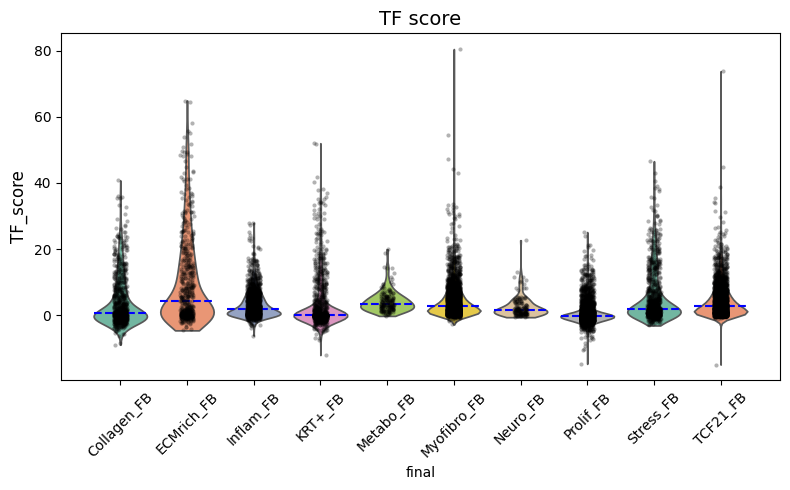

In [128]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Log normalization
sc.pp.normalize_total(Fibro, target_sum=1e4)
sc.pp.log1p(Fibro)

# 2. Score 계산
tf_genes = ['IRF7', 'JUND', 'SPIB', 'ROS', 'ATF3', 'IRF1', 'RUNX3', 'JUN']

# 유전자들이 데이터셋에 있는지 확인 (있는 것만 사용)
tf_genes_filtered = [gene for gene in tf_genes if gene in Fibro.var_names]

sc.tl.score_genes(Fibro, gene_list=tf_genes_filtered, score_name='TF_score')

# 3. 결과 보기 (groupby: 'final' 그룹별 평균 TF_score)
grouped_scores = Fibro.obs.groupby('final')['TF_score'].mean()

# 필요한 데이터 추출
df = Fibro.obs[['TF_score', 'final']].dropna()

# Figure 설정
plt.figure(figsize=(8, 5))

# Violin plot with group-specific colors
ax = sns.violinplot(x='final', y='TF_score', data=df, inner=None, cut=0, palette='Set2')

# Stripplot (개별 데이터 점)
sns.stripplot(x='final', y='TF_score', data=df, color='k', alpha=0.3, s=3, jitter=True)

# Median 선 표시
medians = df.groupby('final')['TF_score'].median().values
for i, median in enumerate(medians):
    ax.plot([i - 0.4, i + 0.4], [median, median], color='blue', linestyle='--', linewidth=1.5)

# x축 카테고리 이름 회전
plt.xticks(rotation=45)

# Plot 타이틀 및 축 라벨
ax.set_title("TF score", fontsize=14)
ax.set_ylabel("TF_score", fontsize=12)

plt.tight_layout()
plt.show()


In [7]:
sc.pp.normalize_total(Fibro)
sc.pp.log1p(Fibro)


KeyError: 'TF_score'

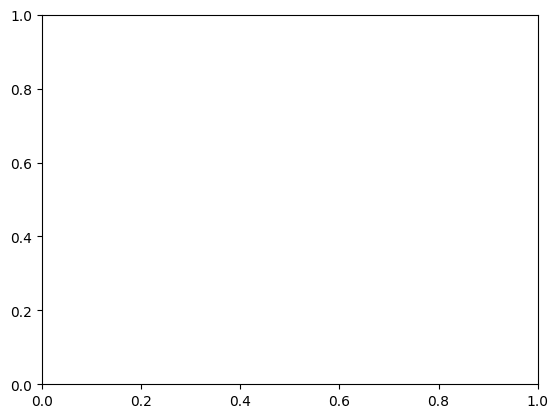

In [8]:
sc.pl.umap(
    Fibro,
    color='TF_score',
    title='UMAP colored by TF_score',
    cmap='viridis',     # 이것만 사용
    edges=False
)


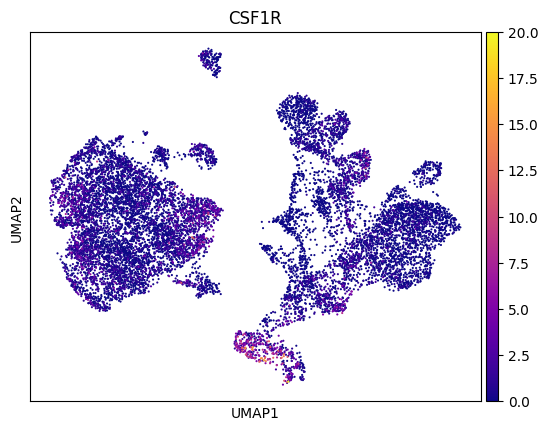

In [9]:
sc.pl.umap(
    Fibro,
    color=['CSF1'],  # TF_score 컬러링 + final annotation
    cmap='plasma',
    edges=False,
    title=['CSF1R'],
    legend_loc='on data'         # final 그룹 이름을 UMAP 위에 표시
)


In [21]:
import scanpy as sc


sc.pl.rank_genes_groups_heatmap(
    Fibro,
    groupby='final',
    n_genes=10,
    show=True,
    cmap='bwr',  # 빨파색으로 fold change 표현
    use_raw=False,  # raw가 없으면 False로 변경
    dendrogram=True,  # 유전자/클러스터 계층적 군집화
    swap_axes=True,   # 유전자 x 축, 클러스터 y 축
)


ValueError: groupby has to be a valid observation. Given final, is not in observations: ['sample', 'status', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'leiden_res_0.02', 'leiden_res_0.10', 'leiden_res_0.25', 'leiden_res_0.30', 'leiden_res_0.50', 'cluster', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'leiden_res_0.20', 'leiden_res_0.40']

In [136]:
import scanpy as sc

# 경로 설정
adata_path = '/home/Data_Drive_8TB/kykim/GC/FibroMacro.h5ad' 

# 파일 불러오기
fibromacro = sc.read_h5ad(adata_path)


In [137]:
import pandas as pd
df = pd.DataFrame(fibromacro.X,
                  index=fibromacro.obs_names,
                  columns=fibromacro.var_names)

In [139]:
a = df[['IRF7', 'JUND', 'SPIB', 'FOS', 'ATF3', 'IRF1', 'RUNX3', 'JUN','IL10','IL4','KLF4','IRF4','SOCS1']]

In [140]:
a['type'] = fibromacro.obs['final'].values
a['status'] = fibromacro.obs['status'].values
a['sample'] = fibromacro.obs['sample'].values
a = a[a['type'] == 'M1']
a

/tmp/ipykernel_2326110/1071869165.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['type'] = fibromacro.obs['final'].values
/tmp/ipykernel_2326110/1071869165.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['status'] = fibromacro.obs['status'].values
/tmp/ipykernel_2326110/1071869165.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.or

,IRF7,JUND,SPIB,FOS,ATF3,IRF1,RUNX3,JUN,IL10,IL4,KLF4,IRF4,SOCS1,type,status,sample
ACGCAGCGTATAATGG_8,0,0,0,183,21,0,0,33,0,0,5,0,0,M1,Normal,GSM5573466_sample1
TGCGCAGGTAAGGGAA_8,0,1,0,0,1,0,0,1,0,0,2,0,0,M1,Normal,GSM5573466_sample1
AATCCAGTCGCCAGCA_9,0,1,0,0,0,0,2,1,0,0,1,0,1,M1,Tumor,GSM5573467_sample2
ACATGGTGTCTACCTC_9,0,6,0,102,19,7,0,64,0,0,2,0,0,M1,Tumor,GSM5573467_sample2
ACGATACAGACTACAA_9,0,0,0,0,1,0,0,0,0,0,0,0,0,M1,Tumor,GSM5573467_sample2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGACCCTCCACACCT.1_40,0,11,1,15,2,2,1,16,0,0,1,0,5,M1,Tumor,GSM5573505_sample40
TTGGATGTCGTCAGAT.1_40,0,5,0,1,1,0,0,1,0,0,0,0,0,M1,Tumor,GSM5573505_sample40
TTGGGCGGTAACAGGC.1_40,0,3,0,12,0,0,0,1,0,0,1,0,0,M1,Tumor,GSM5573505_sample40
TTTAGTCAGCACAAAT.1_40,0,0,0,0,1,0,0,0,0,0,2,0,0,M1,Tumor,GSM5573505_sample40


/tmp/ipykernel_2326110/3216515251.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bulk = a[gene_cols + ['sample']].groupby('sample').sum()
/tmp/ipykernel_2326110/3216515251.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  status_map = a.groupby('sample')['status'].first()


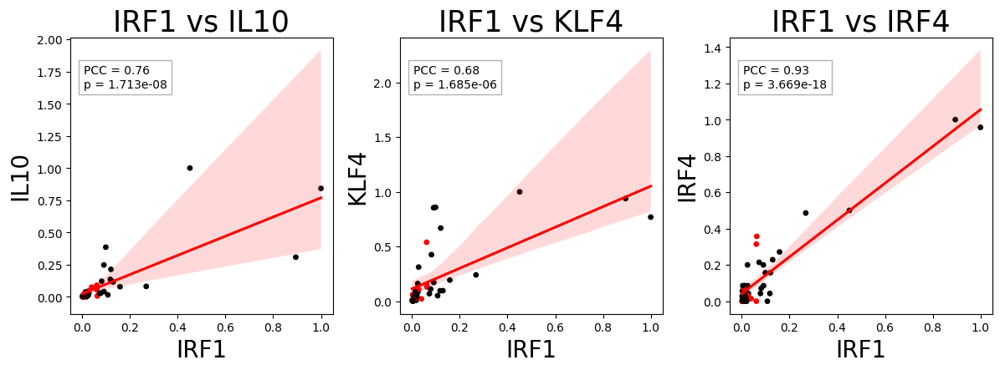

In [144]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 유전자 리스트
gene_cols = ['IL10','KLF4','IRF4','IRF1']  # 리스트 안의 리스트 제거
# pseudobulk 처리 (sample별 유전자 합산)
bulk = a[gene_cols + ['sample']].groupby('sample').sum()

# sample별 status는 따로 저장
status_map = a.groupby('sample')['status'].first()

# plot 설정
plt.figure(figsize=(16, 8))  # 2행 4열에 맞는 크기
plot_idx = 1

for gene in gene_cols:
    if gene == 'IRF1':
        continue

    # 두 유전자만 정규화
    sub_df = bulk[[gene, 'IRF1']]
    sub_df_norm = (sub_df - sub_df.min()) / (sub_df.max() - sub_df.min())

    # 상태 정보 추가
    sub_df_norm['status'] = status_map

    # 색상 설정: Normal이면 빨강, 아니면 검정
    colors = sub_df_norm['status'].apply(lambda x: 'red' if x == 'Normal' else 'black')

    # 상관계수 계산
    r, p = pearsonr(sub_df_norm['IRF1'], sub_df_norm[gene])

    # subplot 그리기
    plt.subplot(2, 4, plot_idx)
    plt.scatter(sub_df_norm['IRF1'], sub_df_norm[gene], c=colors, s=15)
    sns.regplot(x=sub_df_norm['IRF1'], y=sub_df_norm[gene], scatter=False, color='red')

    # 텍스트 추가
    plt.text(0.05, 0.9, f'PCC = {r:.2f}\np = {p:.3e}',
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

    plt.xlabel('IRF1', fontsize=20)
    plt.ylabel(f'{gene}', fontsize=20)
    plt.title(f'IRF1 vs {gene}', fontsize=25)
    plot_idx += 1

plt.tight_layout()
plt.show()


/tmp/ipykernel_2326110/1511325590.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bulk = a[gene_cols + ['sample']].groupby('sample').sum()
/tmp/ipykernel_2326110/1511325590.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  status_map = a.groupby('sample')['status'].first()


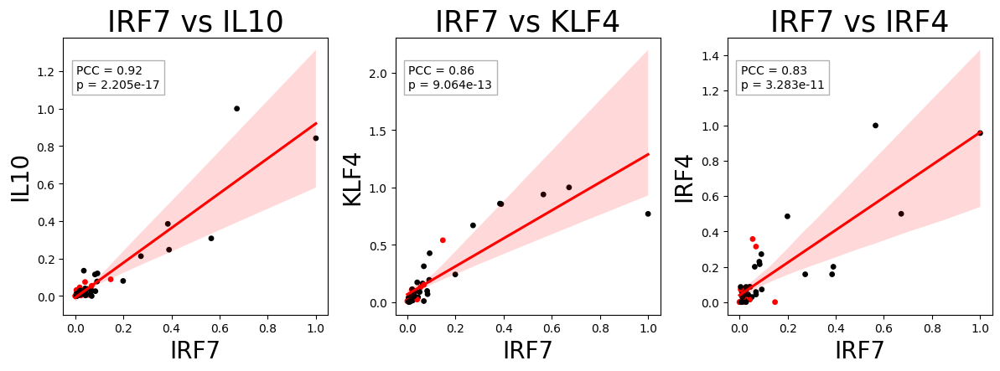

In [149]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 유전자 리스트
gene_cols = ['IL10','KLF4','IRF4','IRF7']  # 리스트 안의 리스트 제거
# pseudobulk 처리 (sample별 유전자 합산)
bulk = a[gene_cols + ['sample']].groupby('sample').sum()

# sample별 status는 따로 저장
status_map = a.groupby('sample')['status'].first()

# plot 설정
plt.figure(figsize=(16, 8))  # 2행 4열에 맞는 크기
plot_idx = 1

for gene in gene_cols:
    if gene == 'IRF7':
        continue

    # 두 유전자만 정규화
    sub_df = bulk[[gene, 'IRF7']]
    sub_df_norm = (sub_df - sub_df.min()) / (sub_df.max() - sub_df.min())

    # 상태 정보 추가
    sub_df_norm['status'] = status_map

    # 색상 설정: Normal이면 빨강, 아니면 검정
    colors = sub_df_norm['status'].apply(lambda x: 'red' if x == 'Normal' else 'black')

    # 상관계수 계산
    r, p = pearsonr(sub_df_norm['IRF7'], sub_df_norm[gene])

    # subplot 그리기
    plt.subplot(2, 4, plot_idx)
    plt.scatter(sub_df_norm['IRF7'], sub_df_norm[gene], c=colors, s=15)
    sns.regplot(x=sub_df_norm['IRF7'], y=sub_df_norm[gene], scatter=False, color='red')

    # 텍스트 추가
    plt.text(0.05, 0.9, f'PCC = {r:.2f}\np = {p:.3e}',
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

    plt.xlabel('IRF7', fontsize=20)
    plt.ylabel(f'{gene}', fontsize=20)
    plt.title(f'IRF7 vs {gene}', fontsize=25)
    plot_idx += 1

plt.tight_layout()
plt.show()


/tmp/ipykernel_2326110/3984570827.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bulk = a[gene_cols + ['sample']].groupby('sample').sum()
/tmp/ipykernel_2326110/3984570827.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  status_map = a.groupby('sample')['status'].first()


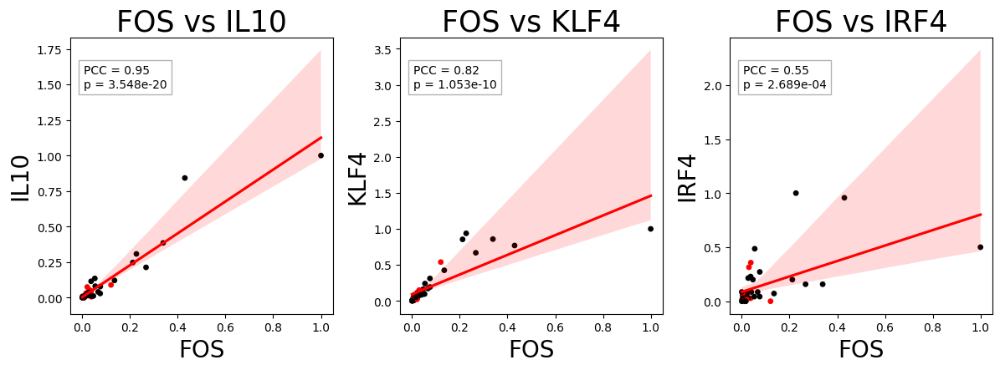

In [153]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 유전자 리스트
gene_cols = ['IL10','KLF4','IRF4','FOS']  # 리스트 안의 리스트 제거
# pseudobulk 처리 (sample별 유전자 합산)
bulk = a[gene_cols + ['sample']].groupby('sample').sum()

# sample별 status는 따로 저장
status_map = a.groupby('sample')['status'].first()

# plot 설정
plt.figure(figsize=(16, 8))  # 2행 4열에 맞는 크기
plot_idx = 1

for gene in gene_cols:
    if gene == 'FOS':
        continue

    # 두 유전자만 정규화
    sub_df = bulk[[gene, 'FOS']]
    sub_df_norm = (sub_df - sub_df.min()) / (sub_df.max() - sub_df.min())

    # 상태 정보 추가
    sub_df_norm['status'] = status_map

    # 색상 설정: Normal이면 빨강, 아니면 검정
    colors = sub_df_norm['status'].apply(lambda x: 'red' if x == 'Normal' else 'black')

    # 상관계수 계산
    r, p = pearsonr(sub_df_norm['FOS'], sub_df_norm[gene])

    # subplot 그리기
    plt.subplot(2, 4, plot_idx)
    plt.scatter(sub_df_norm['FOS'], sub_df_norm[gene], c=colors, s=15)
    sns.regplot(x=sub_df_norm['FOS'], y=sub_df_norm[gene], scatter=False, color='red')

    # 텍스트 추가
    plt.text(0.05, 0.9, f'PCC = {r:.2f}\np = {p:.3e}',
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

    plt.xlabel('FOS', fontsize=20)
    plt.ylabel(f'{gene}', fontsize=20)
    plt.title(f'FOS vs {gene}', fontsize=25)
    plot_idx += 1

plt.tight_layout()
plt.show()


/tmp/ipykernel_2326110/2436909141.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bulk = a[gene_cols + ['sample']].groupby('sample').sum()
/tmp/ipykernel_2326110/2436909141.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  status_map = a.groupby('sample')['status'].first()


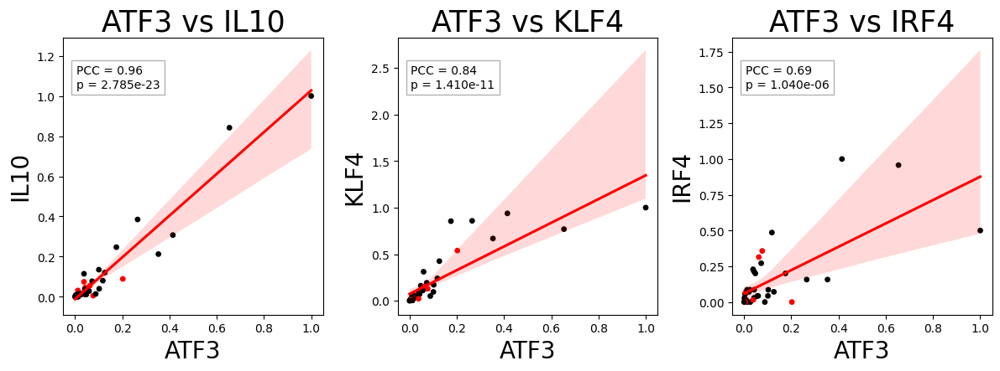

In [155]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 유전자 리스트
gene_cols = ['IL10','KLF4','IRF4','ATF3']  # 리스트 안의 리스트 제거
# pseudobulk 처리 (sample별 유전자 합산)
bulk = a[gene_cols + ['sample']].groupby('sample').sum()

# sample별 status는 따로 저장
status_map = a.groupby('sample')['status'].first()

# plot 설정
plt.figure(figsize=(16, 8))  # 2행 4열에 맞는 크기
plot_idx = 1

for gene in gene_cols:
    if gene == 'ATF3':
        continue

    # 두 유전자만 정규화
    sub_df = bulk[[gene, 'ATF3']]
    sub_df_norm = (sub_df - sub_df.min()) / (sub_df.max() - sub_df.min())

    # 상태 정보 추가
    sub_df_norm['status'] = status_map

    # 색상 설정: Normal이면 빨강, 아니면 검정
    colors = sub_df_norm['status'].apply(lambda x: 'red' if x == 'Normal' else 'black')

    # 상관계수 계산
    r, p = pearsonr(sub_df_norm['ATF3'], sub_df_norm[gene])

    # subplot 그리기
    plt.subplot(2, 4, plot_idx)
    plt.scatter(sub_df_norm['ATF3'], sub_df_norm[gene], c=colors, s=15)
    sns.regplot(x=sub_df_norm['ATF3'], y=sub_df_norm[gene], scatter=False, color='red')

    # 텍스트 추가
    plt.text(0.05, 0.9, f'PCC = {r:.2f}\np = {p:.3e}',
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

    plt.xlabel('ATF3', fontsize=20)
    plt.ylabel(f'{gene}', fontsize=20)
    plt.title(f'ATF3 vs {gene}', fontsize=25)
    plot_idx += 1

plt.tight_layout()
plt.show()


/tmp/ipykernel_2326110/3928036197.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bulk = a[gene_cols + ['sample']].groupby('sample').sum()
/tmp/ipykernel_2326110/3928036197.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  status_map = a.groupby('sample')['status'].first()


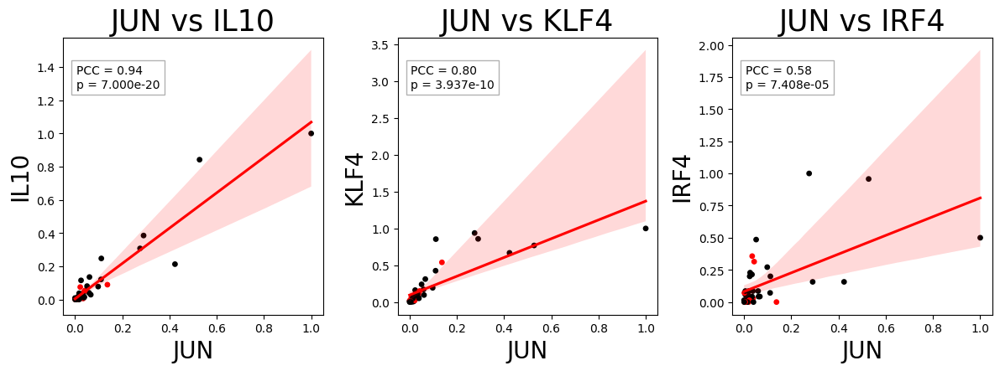

In [156]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 유전자 리스트
gene_cols = ['IL10','KLF4','IRF4','JUN']  # 리스트 안의 리스트 제거
# pseudobulk 처리 (sample별 유전자 합산)
bulk = a[gene_cols + ['sample']].groupby('sample').sum()

# sample별 status는 따로 저장
status_map = a.groupby('sample')['status'].first()

# plot 설정
plt.figure(figsize=(16, 8))  # 2행 4열에 맞는 크기
plot_idx = 1

for gene in gene_cols:
    if gene == 'JUN':
        continue

    # 두 유전자만 정규화
    sub_df = bulk[[gene, 'JUN']]
    sub_df_norm = (sub_df - sub_df.min()) / (sub_df.max() - sub_df.min())

    # 상태 정보 추가
    sub_df_norm['status'] = status_map

    # 색상 설정: Normal이면 빨강, 아니면 검정
    colors = sub_df_norm['status'].apply(lambda x: 'red' if x == 'Normal' else 'black')

    # 상관계수 계산
    r, p = pearsonr(sub_df_norm['JUN'], sub_df_norm[gene])

    # subplot 그리기
    plt.subplot(2, 4, plot_idx)
    plt.scatter(sub_df_norm['JUN'], sub_df_norm[gene], c=colors, s=15)
    sns.regplot(x=sub_df_norm['JUN'], y=sub_df_norm[gene], scatter=False, color='red')

    # 텍스트 추가
    plt.text(0.05, 0.9, f'PCC = {r:.2f}\np = {p:.3e}',
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

    plt.xlabel('JUN', fontsize=20)
    plt.ylabel(f'{gene}', fontsize=20)
    plt.title(f'JUN vs {gene}', fontsize=25)
    plot_idx += 1

plt.tight_layout()
plt.show()


/tmp/ipykernel_2326110/2734957006.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bulk = a[gene_cols + ['sample']].groupby('sample').sum()
/tmp/ipykernel_2326110/2734957006.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  status_map = a.groupby('sample')['status'].first()


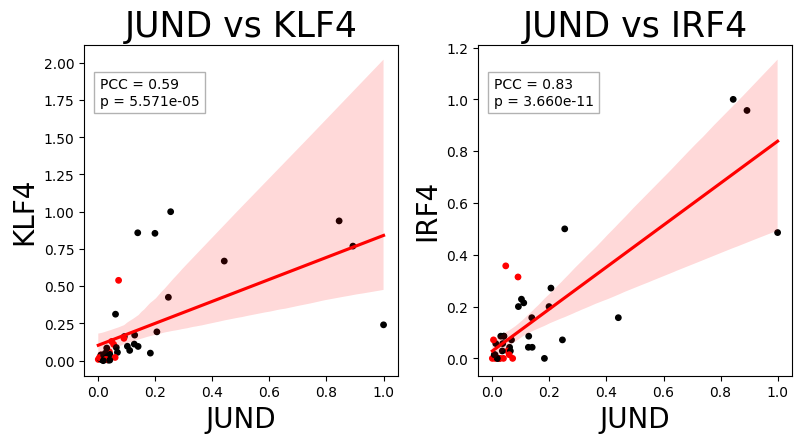

In [162]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 유전자 리스트
gene_cols = ['KLF4','IRF4','JUND']  # 리스트 안의 리스트 제거
# pseudobulk 처리 (sample별 유전자 합산)
bulk = a[gene_cols + ['sample']].groupby('sample').sum()

# sample별 status는 따로 저장
status_map = a.groupby('sample')['status'].first()

# plot 설정
plt.figure(figsize=(16, 8))  # 2행 4열에 맞는 크기
plot_idx = 1

for gene in gene_cols:
    if gene == 'JUND':
        continue

    # 두 유전자만 정규화
    sub_df = bulk[[gene, 'JUND']]
    sub_df_norm = (sub_df - sub_df.min()) / (sub_df.max() - sub_df.min())

    # 상태 정보 추가
    sub_df_norm['status'] = status_map

    # 색상 설정: Normal이면 빨강, 아니면 검정
    colors = sub_df_norm['status'].apply(lambda x: 'red' if x == 'Normal' else 'black')

    # 상관계수 계산
    r, p = pearsonr(sub_df_norm['JUND'], sub_df_norm[gene])

    # subplot 그리기
    plt.subplot(2, 4, plot_idx)
    plt.scatter(sub_df_norm['JUND'], sub_df_norm[gene], c=colors, s=15)
    sns.regplot(x=sub_df_norm['JUND'], y=sub_df_norm[gene], scatter=False, color='red')

    # 텍스트 추가
    plt.text(0.05, 0.9, f'PCC = {r:.2f}\np = {p:.3e}',
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

    plt.xlabel('JUND', fontsize=20)
    plt.ylabel(f'{gene}', fontsize=20)
    plt.title(f'JUND vs {gene}', fontsize=25)
    plot_idx += 1

plt.tight_layout()
plt.show()


/tmp/ipykernel_2326110/2131911686.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bulk = a[gene_cols + ['sample']].groupby('sample').sum()
/tmp/ipykernel_2326110/2131911686.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  status_map = a.groupby('sample')['status'].first()


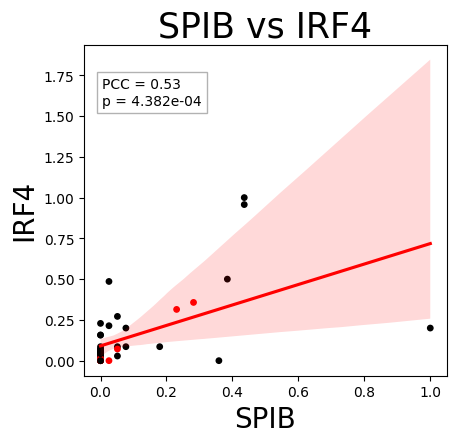

In [161]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 유전자 리스트
gene_cols = ['IRF4','SPIB']  # 리스트 안의 리스트 제거
# pseudobulk 처리 (sample별 유전자 합산)
bulk = a[gene_cols + ['sample']].groupby('sample').sum()

# sample별 status는 따로 저장
status_map = a.groupby('sample')['status'].first()

# plot 설정
plt.figure(figsize=(16, 8))  # 2행 4열에 맞는 크기
plot_idx = 1

for gene in gene_cols:
    if gene == 'SPIB':
        continue

    # 두 유전자만 정규화
    sub_df = bulk[[gene, 'SPIB']]
    sub_df_norm = (sub_df - sub_df.min()) / (sub_df.max() - sub_df.min())

    # 상태 정보 추가
    sub_df_norm['status'] = status_map

    # 색상 설정: Normal이면 빨강, 아니면 검정
    colors = sub_df_norm['status'].apply(lambda x: 'red' if x == 'Normal' else 'black')

    # 상관계수 계산
    r, p = pearsonr(sub_df_norm['SPIB'], sub_df_norm[gene])

    # subplot 그리기
    plt.subplot(2, 4, plot_idx)
    plt.scatter(sub_df_norm['SPIB'], sub_df_norm[gene], c=colors, s=15)
    sns.regplot(x=sub_df_norm['SPIB'], y=sub_df_norm[gene], scatter=False, color='red')

    # 텍스트 추가
    plt.text(0.05, 0.9, f'PCC = {r:.2f}\np = {p:.3e}',
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

    plt.xlabel('SPIB', fontsize=20)
    plt.ylabel(f'{gene}', fontsize=20)
    plt.title(f'SPIB vs {gene}', fontsize=25)
    plot_idx += 1

plt.tight_layout()
plt.show()


/tmp/ipykernel_2326110/1186019778.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bulk = a[gene_cols + ['sample']].groupby('sample').sum()
/tmp/ipykernel_2326110/1186019778.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  status_map = a.groupby('sample')['status'].first()


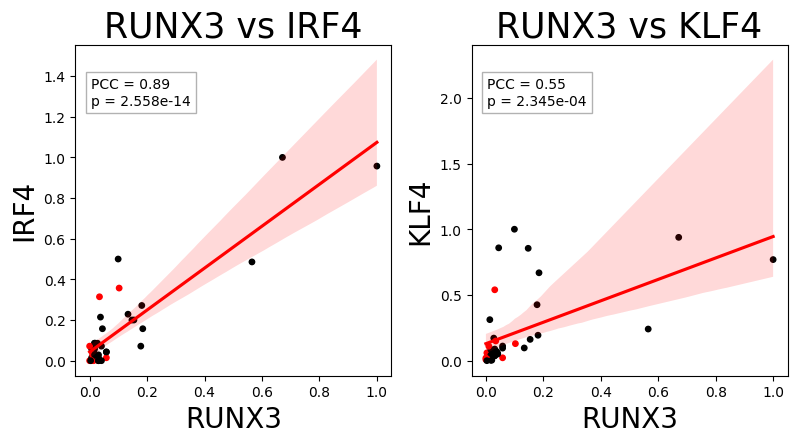

In [160]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 유전자 리스트
gene_cols = ['IRF4','RUNX3','KLF4']  # 리스트 안의 리스트 제거
# pseudobulk 처리 (sample별 유전자 합산)
bulk = a[gene_cols + ['sample']].groupby('sample').sum()

# sample별 status는 따로 저장
status_map = a.groupby('sample')['status'].first()

# plot 설정
plt.figure(figsize=(16, 8))  # 2행 4열에 맞는 크기
plot_idx = 1

for gene in gene_cols:
    if gene == 'RUNX3':
        continue

    # 두 유전자만 정규화
    sub_df = bulk[[gene, 'RUNX3']]
    sub_df_norm = (sub_df - sub_df.min()) / (sub_df.max() - sub_df.min())

    # 상태 정보 추가
    sub_df_norm['status'] = status_map

    # 색상 설정: Normal이면 빨강, 아니면 검정
    colors = sub_df_norm['status'].apply(lambda x: 'red' if x == 'Normal' else 'black')

    # 상관계수 계산
    r, p = pearsonr(sub_df_norm['RUNX3'], sub_df_norm[gene])

    # subplot 그리기
    plt.subplot(2, 4, plot_idx)
    plt.scatter(sub_df_norm['RUNX3'], sub_df_norm[gene], c=colors, s=15)
    sns.regplot(x=sub_df_norm['RUNX3'], y=sub_df_norm[gene], scatter=False, color='red')

    # 텍스트 추가
    plt.text(0.05, 0.9, f'PCC = {r:.2f}\np = {p:.3e}',
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

    plt.xlabel('RUNX3', fontsize=20)
    plt.ylabel(f'{gene}', fontsize=20)
    plt.title(f'RUNX3 vs {gene}', fontsize=25)
    plot_idx += 1

plt.tight_layout()
plt.show()


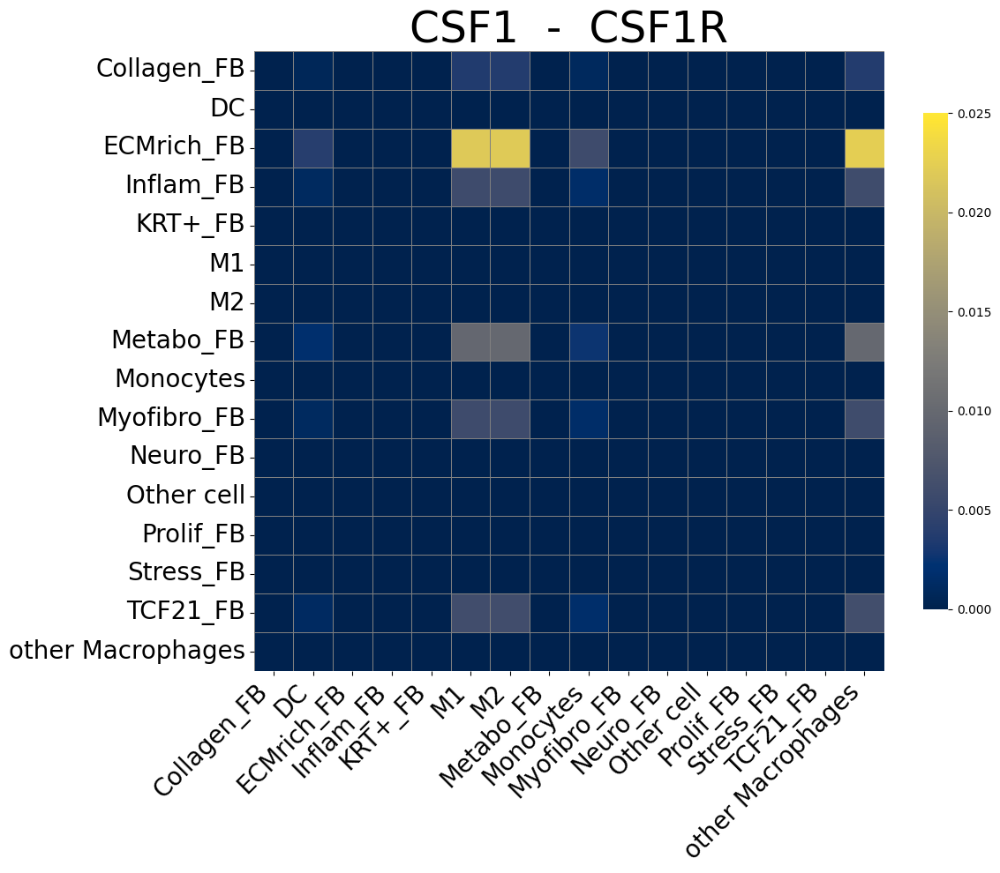

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

labels = ["Collagen_FB", "DC", "ECMrich_FB", "Inflam_FB", "KRT+_FB", "M1", "M2", "Metabo_FB",
          "Monocytes", "Myofibro_FB", "Neuro_FB", "Other cell", "Prolif_FB", "Stress_FB",
          "TCF21_FB", "other Macrophages"]

data = [
    [0, 0.0006494938, 0, 0, 0, 0.003612518, 0.003630934, 0, 0.0009390125, 0, 0, 0, 0, 0, 0, 0.003689748],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0.0040006851, 0, 0, 0, 0.021916726, 0.022026390, 0, 0.0057753991, 0, 0, 0, 0, 0, 0, 0.022376487],
    [0, 0.0010477491, 0, 0, 0, 0.005817058, 0.005846646, 0, 0.0015145252, 0, 0, 0, 0, 0, 0, 0.005941138],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0.0017593343, 0, 0, 0, 0.009736179, 0.009785505, 0, 0.0025423173, 0, 0, 0, 0, 0, 0, 0.009943019],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0.0010390834, 0, 0, 0, 0.005769174, 0.005798520, 0, 0.0015020046, 0, 0, 0, 0, 0, 0, 0.005892238],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0.0010913902, 0, 0, 0, 0.006058147, 0.006088954, 0, 0.0015775778, 0, 0, 0, 0, 0, 0, 0.006187337],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
]

df = pd.DataFrame(data, index=labels, columns=labels)

plt.figure(figsize=(12, 10))
sns.heatmap(df, cmap="cividis", square=False, cbar_kws={"shrink": 0.8},
            linewidths=0.5, linecolor='gray', vmax=0.025)
plt.title("CSF1  -  CSF1R", fontsize=35)
plt.xticks(rotation=45, ha="right", fontsize=20)  # x축 글씨 크기 조절
plt.yticks(rotation=0, fontsize=20)               # y축 글씨 크기 조절
plt.tight_layout()
plt.show()


<Figure size 1200x1000 with 0 Axes>

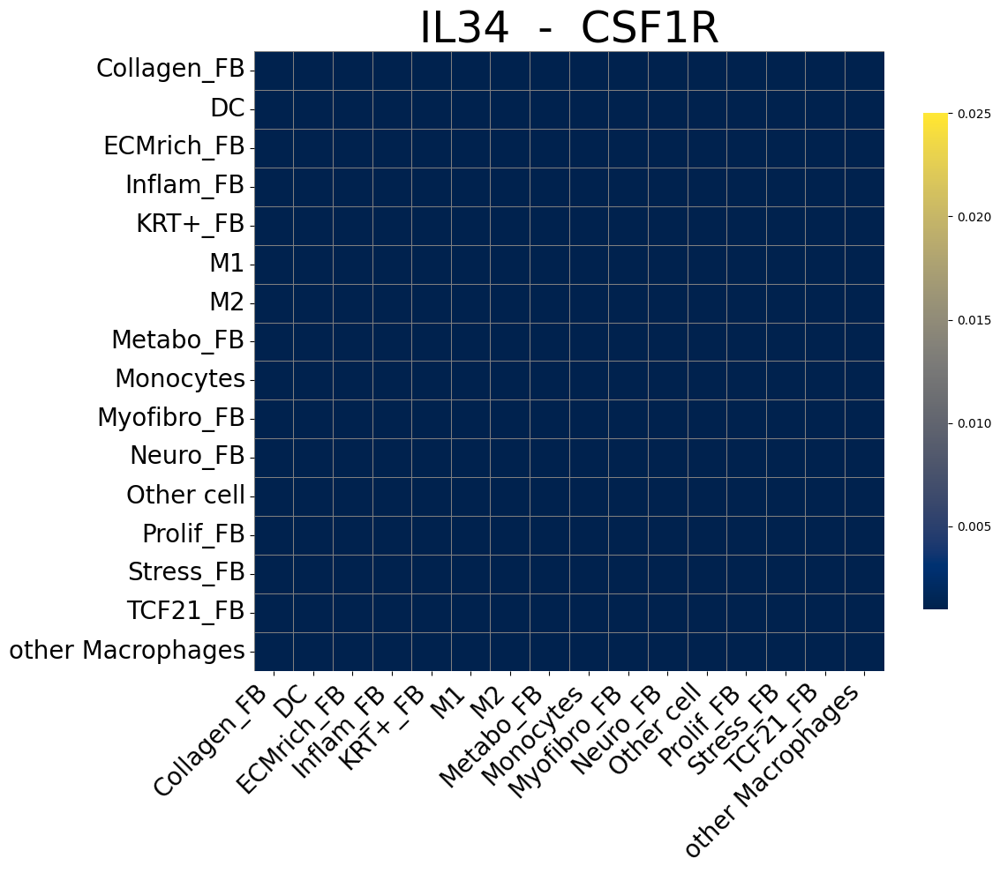

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

labels = ["Collagen_FB", "DC", "ECMrich_FB", "Inflam_FB", "KRT+_FB", "M1", "M2", "Metabo_FB",
          "Monocytes", "Myofibro_FB", "Neuro_FB", "Other cell", "Prolif_FB", "Stress_FB",
          "TCF21_FB", "other Macrophages"]

# 아주 작은 값으로 채워서 색상 차 없게
data = np.full((16, 16), 0.001)

df = pd.DataFrame(data, index=labels, columns=labels)

plt.figure(figsize=(12, 10))

plt.figure(figsize=(12, 10))
sns.heatmap(df, cmap="cividis", square=False, cbar_kws={"shrink": 0.8},
            linewidths=0.5, linecolor='gray', vmax=0.025)
plt.title("IL34  -  CSF1R", fontsize=35)
plt.xticks(rotation=45, ha="right", fontsize=20)  # x축 글씨 크기 조절
plt.yticks(rotation=0, fontsize=20)               # y축 글씨 크기 조절
plt.tight_layout()
plt.show()
